# Student Information
Name: 周芊妤

Student ID: 711233118

GitHub ID: ChienYuuuuu

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

---

# The data from Master

In [110]:
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1. The Data

The 20 Newsgroups data set is a collection of approximately 20,000 newsgroup documents, partitioned (nearly) evenly across 20 different newsgroups. To the best of our knowledge, it was originally collected by Ken Lang, probably for his paper “Newsweeder: Learning to filter netnews,” though he does not explicitly mention this collection. The 20 newsgroups collection has become a popular data set for experiments in text applications of machine learning techniques, such as text classification and text clustering.

---

## 2. Data Preparation

In [111]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

In [112]:
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42) 
#This command also shuffles the data randomly, but with random_state we can bring the same distribution of data everytime 
#if we choose the same number, in this case "42". This is good for us, it means we can reproduce the same results every time
#we want to run the code.

**Note** the `twenty_train` is just a bunch of objects that can be accessed as python dictionaries; so, you can do the following operations on `twenty_train`

In [113]:
twenty_train.target_names

['alt.atheism', 'comp.graphics', 'sci.med', 'soc.religion.christian']

In [114]:
len(twenty_train.data) # number of documents

2257

#### We can also print an example from the subset

In [115]:
# An example of what the subset contains
# The number in [] represents which document I want to see
# [0] is the first document
print("\n".join(twenty_train.data[0].split("\n")))

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.



... we can also get the category of 10 documents via `target` key value 

In [116]:
# category index of first 10 documents.
twenty_train.target[0:10]

array([1, 1, 3, 3, 3, 3, 3, 2, 2, 2], dtype=int64)

Here is one way to get access to the *text* version of the label of a subset of our training data:

In [117]:
for t in twenty_train.target[:10]: # It shows the first 10 categories
    print(twenty_train.target_names[t])

comp.graphics
comp.graphics
soc.religion.christian
soc.religion.christian
soc.religion.christian
soc.religion.christian
soc.religion.christian
sci.med
sci.med
sci.med


---

### **>>> Exercise 1 (Watch Video):**  
In this exercise, please print out the *text* data for the first three samples in the dataset. (See the above code for help)

In [ ]:
for text in twenty_train.data[:3]: # It shows the first 3 texts
    print(text)

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.

From: ani@ms.uky.edu (Aniruddha B. Deglurkar)
Subject: help: Splitting a trimming region along a mesh 
Organization: University Of Kentucky, Dept. of Math Sciences
Lines: 28



	Hi,

	I have a problem, I hope some of the 'gurus' can help me solve.

	Background of the problem:
	I have a rectangular mesh in the uv

---

## 3. Data Transformation

### 3.1 Converting Dictionary into Pandas Dataframe

In [118]:
import os
print(os.getcwd())  # to show the current working directory

e:\DMLab1\DM2024-Lab1-Master-main


In [119]:
import pandas as pd
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [120]:
len(X) # number of documents

2257

### Adding Columns

In [121]:
# add category to the dataframe
X['category'] = twenty_train.target

In [122]:
# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train)) # t is the category # twenty_train is the data

In [123]:
X[0:10] # show the first 10 documents

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


---

### 3.2 Familiarizing yourself with the Data

In [51]:
# a simple query # show the first 10 documents (just the column 'text' and 'category_name') 
X[:10][["text","category_name"]]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,sci.med


### **>>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

The following code is to select all the documents in 'soc.religion.christian' category.

In [124]:
# To select all the documents in 'soc.religion.christian' category.

X.query('category_name == "soc.religion.christian"') 

,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
...,...,...,...
2229,From: jcj@tellabs.com (jcj) Subject: Re: proof...,3,soc.religion.christian
2230,From: news@cbnewsk.att.com Subject: Re: Bible ...,3,soc.religion.christian
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian


In [53]:
# To select all the documents in 'soc.religion.christian' category.
# The code can also be written as the following code:

X[X['category_name'] == 'soc.religion.christian'] 

,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
...,...,...,...
2229,From: jcj@tellabs.com (jcj) Subject: Re: proof...,3,soc.religion.christian
2230,From: news@cbnewsk.att.com Subject: Re: Bible ...,3,soc.religion.christian
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian


The following code is to select the documents in the 'comp.graphics category' that are longer than 100 characters.

In [54]:
# To select the documents in the 'comp.graphics category' that are longer than 100 characters.

X.query('category_name == "comp.graphics" and text.str.len() > 100') 

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...,1,comp.graphics
14,From: sloan@cis.uab.edu (Kenneth Sloan) Subjec...,1,comp.graphics
15,From: Mike_Peredo@mindlink.bc.ca (Mike Peredo)...,1,comp.graphics
...,...,...,...
2232,From: lipman@oasys.dt.navy.mil (Robert Lipman)...,1,comp.graphics
2236,From: dkusswur@falcon.depaul.edu (Daniel C. Ku...,1,comp.graphics
2241,From: dls@aeg.dsto.gov.au (David Silver) Subje...,1,comp.graphics
2242,From: Sean McMains <mcmains@unt.edu> Subject: ...,1,comp.graphics


In [55]:
# It is to select the documents in 'comp.graphics category' that are longer than 100 characters
# The code can also be written as the following code:

X[(X['category_name'] == 'comp.graphics') & (X['text'].str.len() > 100)]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...,1,comp.graphics
14,From: sloan@cis.uab.edu (Kenneth Sloan) Subjec...,1,comp.graphics
15,From: Mike_Peredo@mindlink.bc.ca (Mike Peredo)...,1,comp.graphics
...,...,...,...
2232,From: lipman@oasys.dt.navy.mil (Robert Lipman)...,1,comp.graphics
2236,From: dkusswur@falcon.depaul.edu (Daniel C. Ku...,1,comp.graphics
2241,From: dls@aeg.dsto.gov.au (David Silver) Subje...,1,comp.graphics
2242,From: Sean McMains <mcmains@unt.edu> Subject: ...,1,comp.graphics


---

### **>>> Exercise 3 (Watch Video):**  
Try to fetch records belonging to the ```sci.med``` category, and query every 10th record. Only show the first 5 records.

In [56]:
# It is to select the documents in the 'sci.med' category that select one sample every 10 rows, and take the first 5 rows and print them out.

print(X[X['category_name'] == 'sci.med'].iloc[::10][0:5]) 

                                                  text  category category_name
7    From: aldridge@netcom.com (Jacquelin Aldridge)...         2       sci.med
49   From: jimj@contractor.EBay.Sun.COM (Jim Jones)...         2       sci.med
82   From: jason@ab20.larc.nasa.gov (Jason Austin) ...         2       sci.med
118  From: rogers@calamari.hi.com (Andrew Rogers) S...         2       sci.med
142  From: lady@uhunix.uhcc.Hawaii.Edu (Lee Lady) S...         2       sci.med


---

## 4. Data Mining using Pandas

### 4.1 Missing Values

In [125]:
# check missing values
X.isnull()

,text,category,category_name
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
2252,False,False,False
2253,False,False,False
2254,False,False,False
2255,False,False,False


In [58]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


---

### >>> **Exercise 4 (Watch Video):** 
Let's try something different. Instead of calculating missing values by column let's try to calculate the missing values in every record instead of every column.  
$Hint$ : `axis` parameter. Check the documentation for more information.

In [126]:
X.isnull().apply(lambda x: dmh.check_missing_values(x), axis=0) # axis=0:rows, axis=1:columns
# This code is to check the missing values in each column

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [127]:
X.isnull().apply(lambda x: dmh.check_missing_values(x), axis=1) # axis=0:rows, axis=1:columns
# This code is to check the missing values in each row.
# It isn't meaningful to check the missing values in each row.

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
2252    (The amoung of missing records is: , 0)
2253    (The amoung of missing records is: , 0)
2254    (The amoung of missing records is: , 0)
2255    (The amoung of missing records is: , 0)
2256    (The amoung of missing records is: , 0)
Length: 2257, dtype: object

---

In [64]:
X.dropna(inplace=True) # This code is to drop the missing values

... and now let us test to see if we gotten rid of the records with missing values. 

In [128]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [66]:
len(X) # after dropping the missing values, the length is 2257.

2257

---

### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

It is because `.isnull()` only checks for NaN values but not check for empty strings, None, or specific placeholders.

In [67]:
# There are some documents that have missing values, like  'NaN', 'None', ''.
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [68]:
NA_df['missing_example'].isnull()

# We found that the missing values are not all be catched by the isnull() function.
# So we need to define the missing values by ourselves.

# 0 True      # A: np.nan                             (missing value)
# 1 True      # B: not provided, defaults to NaN      (missing value)
# 2 False     # C: 'NaN'                              (string, not a missing value)
# 3 False     # D: 'None'                             (string, not a missing value)
# 4 True      # E: None                               (Python's None, treated as a missing value)
# 5 False     # F: ''                                 (empty string, not a missing value)

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

0 True      # A: np.nan                             (missing value)\
1 True      # B: not provided, defaults to NaN      (missing value)\
2 False     # C: 'NaN'                              (string, not a missing value)\
3 False     # D: 'None'                             (string, not a missing value)\
4 True      # E: None                               (Python's None, treated as a missing value)\
5 False     # F: ''                                 (empty string, not a missing value)

It needs to change the way we did.

In [69]:
NA_df = pd.DataFrame(NA_dict, columns=['id', 'missing_example'])

print("Original DataFrame:")
NA_df

Original DataFrame:


,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


Define missing conditions, including null, empty strings, None, and specific placeholders.

In [70]:
# Define missing definitions by ourselves 
missing_def = NA_df['missing_example'].isnull() | (NA_df['missing_example'] == '') | \
                     (NA_df['missing_example'] == 'NaN') | (NA_df['missing_example'] == 'None')

print("Missing vlaues:")
print(missing_def)

Missing vlaues:
0    True
1    True
2    True
3    True
4    True
5    True
Name: missing_example, dtype: bool


---

### 4.2 Dealing with Duplicate Data

In [129]:
X.duplicated() # This code is to check the duplicate records(重複行)

0       False
1       False
2       False
3       False
4       False
        ...  
2252    False
2253    False
2254    False
2255    False
2256    False
Length: 2257, dtype: bool

---

## 5.  Data Preprocessing

- Aggregation
- Sampling
- Dimensionality Reduction
- Feature Subset Selection
- Feature Creation
- Discretization and Binarization
- Attribute Transformation

### 5.1 Sampling

In [130]:
X_sample = X.sample(n=1000, random_state=55) #random state # it is to randomly choose 1000 documents from X.

In [131]:
len(X_sample) # There are 1000 documents in X_sample.

1000

In [132]:
X_sample[0:4] # Shoe the first 4 documents in X_sample.

,text,category,category_name
1988,From: Donald Mackie <Donald_Mackie@med.umich.e...,2,sci.med
887,From: bruce@liv.ac.uk (Bruce Stephens) Subject...,3,soc.religion.christian
1133,From: mcgoy@unicorn.acs.ttu.edu (David McGaugh...,0,alt.atheism
1839,From: nyeda@cnsvax.uwec.edu (David Nye) Subjec...,2,sci.med


---

### >>> Exercise 6 (take home):
Notice any changes from the `X` dataframe to the `X_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

There are 2257 rows in the original dataset, while 1000 rows were sampled.

In [82]:
print('The length of X is:', len(X)) 
print('The length of X_sample is:', len(X_sample) )
#  There are 2257 rows in the original dataset, while 1000 rows were sampled.

The length of X is: 2257
The length of X_sample is: 1000


The index in X ranges from 0 to 2256, while in X_sample, it consists of 1000 randomly selected indexes.

In [84]:
# The index in X ranges from 0 to 2256, while in X_sample, it consists of 1000 randomly selected indexes.

print("Index in X:", X.index)
print("Index in X_sample:", X_sample.index)

Index in X: RangeIndex(start=0, stop=2257, step=1)
Index in X_sample: Index([1988,  887, 1133, 1839, 1281, 1722, 1283,  901,  774, 1673,
       ...
        164,  525, 1960,  574, 2012,  618, 1657, 2040,  846, 1936],
      dtype='int64', length=1000)


The following indexes are present in X but not in X_sample.

In [85]:
# The difference between index in X and X_sample
X.index.difference(X_sample.index)

Index([   1,    3,    4,    5,    8,    9,   10,   13,   14,   15,
       ...
       2235, 2237, 2238, 2241, 2244, 2245, 2246, 2249, 2250, 2251],
      dtype='int64', length=1257)

The following is the difference of the statistical data between X and X_sample.\
Although X_sample contains less data, there is almost no difference.

In [86]:
# The following is the difference of the statistical data between X and X_sample.

print("Statistic data of X:")
X.describe()

Statistic data of X:


,category
count,2257.000000
mean,1.581303
std,1.095472
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,3.000000


In [87]:
print("Statistic data of X_sample:")
X_sample.describe()

# Although X_sample contains less data, there is almost no difference.

Statistic data of X_sample:


,category
count,1000.000000
mean,1.601000
std,1.084885
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,3.000000


---

In [88]:
import matplotlib.pyplot as plt
%matplotlib inline

In [89]:
categories # There are 4 categories in categories.

['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

category_name
soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='category_name'>

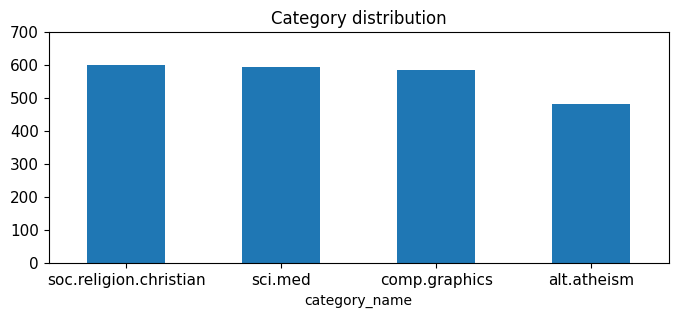

In [90]:
print(X.category_name.value_counts())

# plot barchart for X
X.category_name.value_counts().plot(kind = 'bar', # bar chart
                                    title = 'Category distribution',
                                    ylim = [0, 700],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

# There are 599 documents in the soc.religion.christian category, 594 in the sci.med category, 584 in the comp.graphics category, and 480 in the alt.atheism category.

category_name
sci.med                   283
soc.religion.christian    262
comp.graphics             249
alt.atheism               206
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='category_name'>

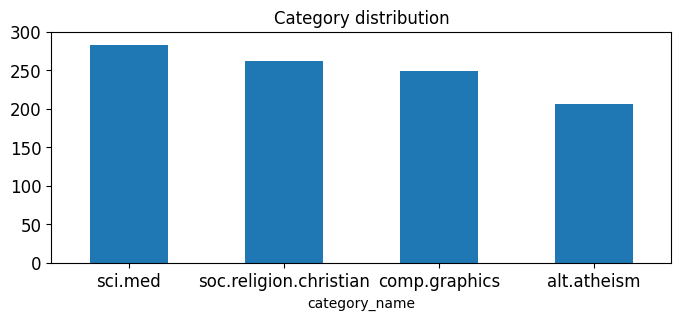

In [91]:
print(X_sample.category_name.value_counts())

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, 300], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

# There are 262 documents in the soc.religion.christian category, 283 in the sci.med category, 262 in the comp.graphics category, and 206 in the alt.atheism category.

---

### >>> **Exercise 7 (Watch Video):**
Notice that for the `ylim` parameters we hardcoded the maximum value for y. Is it possible to automate this instead of hard-coding it? How would you go about doing that? (Hint: look at code above for clues)

category_name
sci.med                   283
soc.religion.christian    262
comp.graphics             249
alt.atheism               206
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='category_name'>

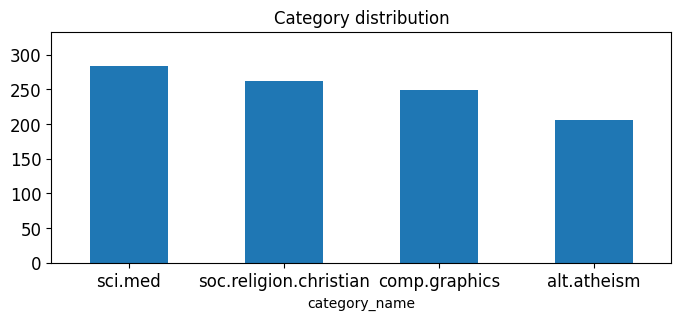

In [ ]:
# The upper bound is calculated by adding 50 to the max number of documents in each category.
upper_bound = max(X_sample.category_name.value_counts() + 50) 

print(X_sample.category_name.value_counts())

plt.style.use('default') # reset style

X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, upper_bound], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

# There are 262 documents in the soc.religion.christian category, 283 in the sci.med category, 262 in the comp.graphics category, and 206 in the alt.atheism category.

---

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

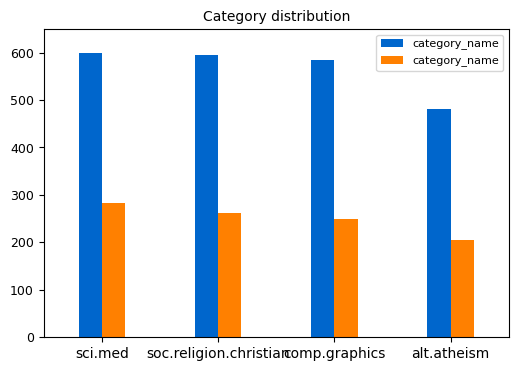

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4)) # the figure
upper_bound = max(X.category_name.value_counts() + 50)
num_categories = len(X.category_name.value_counts()) # calculate the number of categories

# plot barchart for X
X.category_name.value_counts().plot(kind = 'bar', width=0.2, position=1, color = '#0066CC', rot = 0, fontsize = 11, ax=ax, label='category_name')

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(kind = 'bar', width=0.2, position=0, color = '#FF8000', rot = 0, fontsize = 11, ax=ax, label='category_name')

ax.set_title('Category distribution', fontsize=10)
ax.legend(prop={'size': 8}) # the size of the legend
ax.set_xlabel('')  # Remove the label of y-axis (the name of y-axis)
ax.tick_params(axis='x', labelsize=10) 
ax.tick_params(axis='y', labelsize=9)  
# ax.set_xlim(-0.5, len(X.category_name.value_counts()) - 0.5)
ax.set_xlim( -0.5, num_categories - 0.5)
ax.set_ylim(0, upper_bound)

plt.show()

# The blue bar chart represents the distribution of documents in the original dataset.
# The orange bar chart represents the distribution of documents in the sample dataset.

---

### 5.2 Feature Creation

In [133]:
import nltk

In [134]:
# takes a like a minute or two to process
X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x)) # This code is to tokenize the text

In [135]:
X[0:4]["unigrams"] # Show the first 4 unigrams.

0    [From, :, sd345, @, city.ac.uk, (, Michael, Co...
1    [From, :, ani, @, ms.uky.edu, (, Aniruddha, B....
2    [From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...
3    [From, :, s0612596, @, let.rug.nl, (, M.M, ., ...
Name: unigrams, dtype: object

---

### 5.3 Feature subset selection

In [136]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer() # count the number of each word.
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix # Term Frequency Vector.
print(X_counts[0])

  (0, 14887)	1
  (0, 29022)	1
  (0, 8696)	4
  (0, 4017)	2
  (0, 33256)	2
  (0, 21661)	3
  (0, 9031)	3
  (0, 31077)	1
  (0, 9805)	2
  (0, 17366)	1
  (0, 32493)	4
  (0, 16916)	2
  (0, 19780)	2
  (0, 17302)	2
  (0, 23122)	1
  (0, 25663)	1
  (0, 16881)	1
  (0, 16082)	1
  (0, 23915)	1
  (0, 32142)	5
  (0, 33597)	2
  (0, 20253)	1
  (0, 587)	1
  (0, 12051)	1
  (0, 5201)	1
  :	:
  (0, 25361)	1
  (0, 25337)	1
  (0, 12833)	2
  (0, 5195)	1
  (0, 27836)	1
  (0, 18474)	1
  (0, 32270)	1
  (0, 9932)	1
  (0, 15837)	1
  (0, 32135)	1
  (0, 17556)	1
  (0, 4378)	1
  (0, 26175)	1
  (0, 9338)	1
  (0, 33572)	1
  (0, 31915)	1
  (0, 177)	2
  (0, 2326)	2
  (0, 3062)	1
  (0, 35416)	1
  (0, 20459)	1
  (0, 14085)	1
  (0, 3166)	1
  (0, 12541)	1
  (0, 230)	1


In [137]:
count_vect.get_feature_names_out()[14887] # the index 14887 word.

'from'

In [138]:
analyze = count_vect.build_analyzer()
analyze("I am craving for a hawaiian pizza right now")

# tokenization, remove stop words (e.g i, a, the), create n-gram (or unigram)

['am', 'craving', 'for', 'hawaiian', 'pizza', 'right', 'now']

---

### **>>> Exercise 9 (Watch Video):**
Let's analyze the first record of our X dataframe with the new analyzer we have just built. Go ahead try it!

`count_vect.build_analyzer()`
 - Tokenization（詞彙標記化）
 - Remove Stop Words（移除停用詞）
 - Create N-gram（或 Unigram）

In [139]:
# How do we turn our array[0] text document into a tokenized text using the build_analyzer()?
analyze(X.text[0]) # This code is to tokenize the text and show the first text

['from',
 'sd345',
 'city',
 'ac',
 'uk',
 'michael',
 'collier',
 'subject',
 'converting',
 'images',
 'to',
 'hp',
 'laserjet',
 'iii',
 'nntp',
 'posting',
 'host',
 'hampton',
 'organization',
 'the',
 'city',
 'university',
 'lines',
 '14',
 'does',
 'anyone',
 'know',
 'of',
 'good',
 'way',
 'standard',
 'pc',
 'application',
 'pd',
 'utility',
 'to',
 'convert',
 'tif',
 'img',
 'tga',
 'files',
 'into',
 'laserjet',
 'iii',
 'format',
 'we',
 'would',
 'also',
 'like',
 'to',
 'do',
 'the',
 'same',
 'converting',
 'to',
 'hpgl',
 'hp',
 'plotter',
 'files',
 'please',
 'email',
 'any',
 'response',
 'is',
 'this',
 'the',
 'correct',
 'group',
 'thanks',
 'in',
 'advance',
 'michael',
 'michael',
 'collier',
 'programmer',
 'the',
 'computer',
 'unit',
 'email',
 'collier',
 'uk',
 'ac',
 'city',
 'the',
 'city',
 'university',
 'tel',
 '071',
 '477',
 '8000',
 'x3769',
 'london',
 'fax',
 '071',
 '477',
 '8565',
 'ec1v',
 '0hb']

---

In [140]:
# We can check the shape of this matrix by:
X_counts.shape # There are 2257 documents and 35788 unique words.

(2257, 35788)

In [141]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '000', '0000', '0000001200', '000005102000', '0001',
       '000100255pixel', '00014', '000406', '0007'], dtype=object)

In [104]:
# we convert from sparse array to normal array # toarray() converts sparse array to normal array
X_counts[0:5, 0:100].toarray() # Show the first 100 words in the first 5 documents.

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [105]:
count_vect.get_feature_names_out()[0:1] # The first term.

array(['00'], dtype=object)

---

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

Show the fifth record.

In [106]:
# fifth_record = X_counts[4].toarray()
fifth_record = X_counts[4].toarray()[0]
fifth_record

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

Find the index of the term 1 in the fifth record.

In [107]:
fifth_1 = np.where(fifth_record == 1)[0] # Find the index of the term 1
fifth_1

# The '1' represents that the term is present in the document.

array([    0,    37,   587,   677,  1490,  1540,  1742,  2203,  2521,
        4852,  5698,  5777,  6430,  7280,  8197,  8525,  8544,  9066,
        9067,  9925, 10481, 10874, 11498, 12731, 13239, 14095, 14309,
       14526, 14887, 15406, 15511, 15612, 15822, 16358, 16585, 16642,
       16703, 16916, 16926, 18363, 18551, 19382, 19383, 20253, 20770,
       20842, 20978, 21060, 21176, 23595, 23733, 23741, 23915, 26356,
       26570, 27031, 27352, 27997, 28091, 28771, 29610, 29785, 30068,
       30199, 30250, 31077, 31948, 32139, 32164, 32179, 32202, 32205,
       33741, 34790, 34935, 34982, 35350, 35638, 35648], dtype=int64)

In [108]:
words_in_fifth_record = [count_vect.get_feature_names_out()[i] for i in fifth_1]
print(words_in_fifth_record)

['00', '01', '14', '15', '22', '22824', '28246', '41', '57', 'am', 'at', 'attend', 'believe', 'brother', 'certain', 'chose', 'christ', 'columbia', 'columbiasc', 'corp', 'customary', 'decision', 'died', 'elder', 'equalivant', 'fc', 'find', 'fnal', 'from', 'given', 'go', 'gov', 'grok11', 'heaven', 'highways', 'his', 'hmmmmmm', 'hp', 'hpfcso', 'invite', 'it', 'king', 'kingdom', 'lines', 'made', 'main', 'many', 'marriage', 'matt', 'odds', 'on', 'one', 'organization', 'provided', 'put', 're', 'refused', 'rexlex', 'righteousness', 'sc', 'shrum', 'sins', 'so', 'son', 'sounds', 'subject', 'tells', 'that', 'then', 'theology', 'there', 'therefore', 'unto', 'wear', 'when', 'who', 'writes', 'you', 'your']


In [109]:
index_word_mapping = {i: count_vect.get_feature_names_out()[i] for i in range(len(count_vect.get_feature_names_out()))}

print("Index and corresponding words in the fifth record:")
for index in fifth_1:
    print(f"Index: {index}: Word: '{index_word_mapping[index]}'")

# Show the index and corresponding words in the fifth record.

Index and corresponding words in the fifth record:
Index: 0: Word: '00'
Index: 37: Word: '01'
Index: 587: Word: '14'
Index: 677: Word: '15'
Index: 1490: Word: '22'
Index: 1540: Word: '22824'
Index: 1742: Word: '28246'
Index: 2203: Word: '41'
Index: 2521: Word: '57'
Index: 4852: Word: 'am'
Index: 5698: Word: 'at'
Index: 5777: Word: 'attend'
Index: 6430: Word: 'believe'
Index: 7280: Word: 'brother'
Index: 8197: Word: 'certain'
Index: 8525: Word: 'chose'
Index: 8544: Word: 'christ'
Index: 9066: Word: 'columbia'
Index: 9067: Word: 'columbiasc'
Index: 9925: Word: 'corp'
Index: 10481: Word: 'customary'
Index: 10874: Word: 'decision'
Index: 11498: Word: 'died'
Index: 12731: Word: 'elder'
Index: 13239: Word: 'equalivant'
Index: 14095: Word: 'fc'
Index: 14309: Word: 'find'
Index: 14526: Word: 'fnal'
Index: 14887: Word: 'from'
Index: 15406: Word: 'given'
Index: 15511: Word: 'go'
Index: 15612: Word: 'gov'
Index: 15822: Word: 'grok11'
Index: 16358: Word: 'heaven'
Index: 16585: Word: 'highways'
Ind

---

In [142]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]] 
# This code is to show the first twenty terms.

In [143]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]] # X.index[how many documents]
# This code is to show the first twenty documents.

In [144]:
plot_z = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z # The first twenty documents and the first 20 terms.

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

![alt txt](https://i.imgur.com/1isxmIV.png)

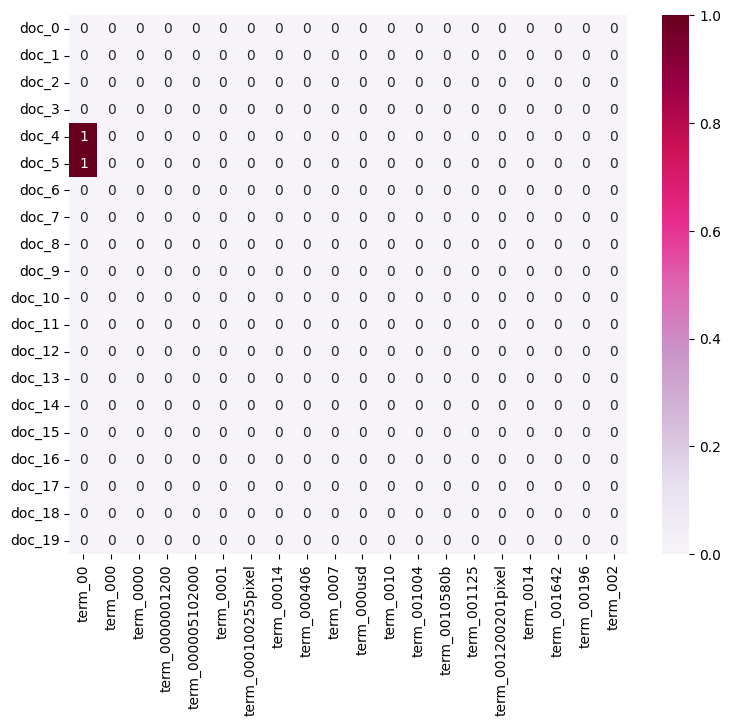

In [145]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

# It draws a heatmap of the first twenty documents and the first twenty terms.
# Because the vector is very sparse, the heatmap is not very informative (it contains many zeros).

---

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

Try to show the first twenty documents with the highest word count and combine X_counts and X_counts_nonzero.

In [146]:
import pandas as pd

# Calculate the total number of words in each document
X_counts_nonzero = (X_counts != 0).sum(axis=1)  # not 0
X_counts_df = pd.DataFrame({'Term Vector': [list(row) for row in X_counts.toarray()]}) # Term frequency vector
X_counts_nonzero_df = pd.DataFrame(X_counts_nonzero, columns=['Nonzero Count'])

# sort by the number of words
X_counts_df = pd.concat([X_counts_df, X_counts_nonzero_df], axis=1)
X_counts_df_sort = X_counts_df.sort_values(by='Nonzero Count', ascending=False) 

# The top 20 documents.
X_counts_df_sort_20 = X_counts_df_sort.head(20)['Term Vector'].tolist()

# The top 20 terms in the first 20 documents.
word_frequency = np.sum(np.array(X_counts_df_sort_20) != 0, axis=0)  # Count the number of times each term appears in the top 20 documents
top_20_words = np.argsort(word_frequency)[-20:][::-1]

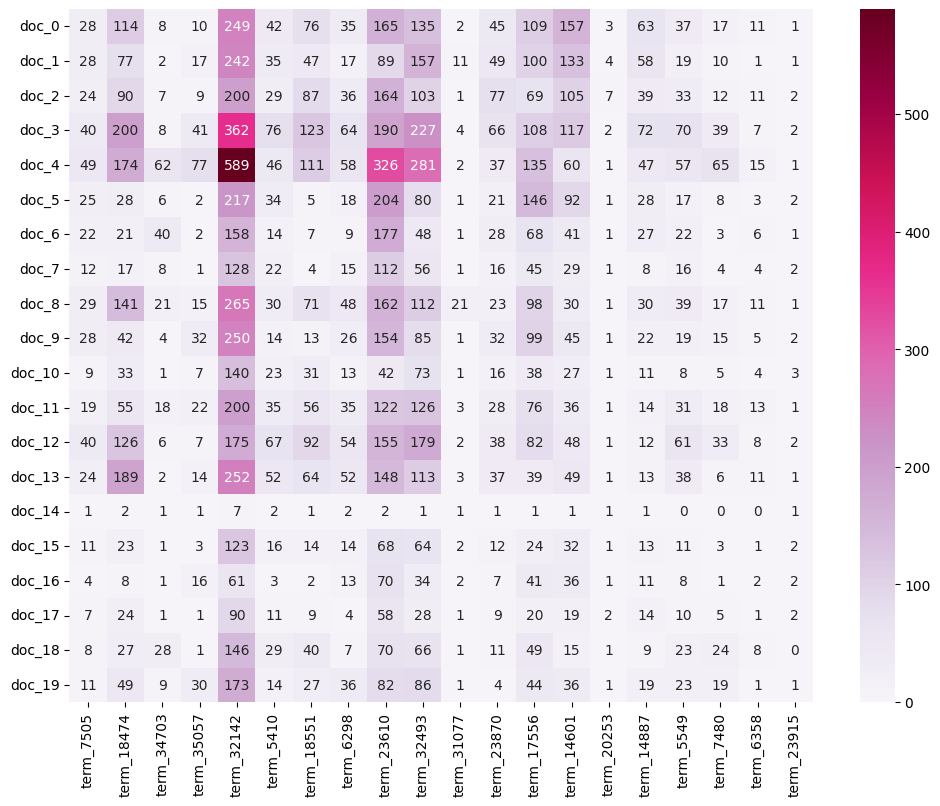

In [147]:
term_vectors = pd.DataFrame(X_counts_df_sort_20)  # The top 20 documents.
plot_z = term_vectors.iloc[:, top_20_words]  # The top 20 terms in the first 20 documents.
plot_z = plot_z.astype(int)

# Heatmap
plot_x = ["term_" + str(i) for i in top_20_words]  # The name of the first 20 terms.
plot_y = ["doc_" + str(i) for i in range(20)]  # The name of the first 20 documents.

df_todraw = pd.DataFrame(plot_z.values, columns=plot_x, index=plot_y)

plt.subplots(figsize=(12, 9))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=np.max(plot_z.values), 
                 annot=True, 
                 fmt='.0f')

plt.show()

# This time, the heatmap is much more informative.

---

In [148]:
# We can also construct the word cloud to show.

# first twenty features only
plot_x_c = [str(i) for i in count_vect.get_feature_names_out()[0:20]] 
# This code is to show the first twenty terms

# obtain document index
plot_y_c = [str(i) for i in list(X.index)[0:20]] # X.index[how many documents]
# This code is to show the first twenty documents

plot_z_c = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z_c

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

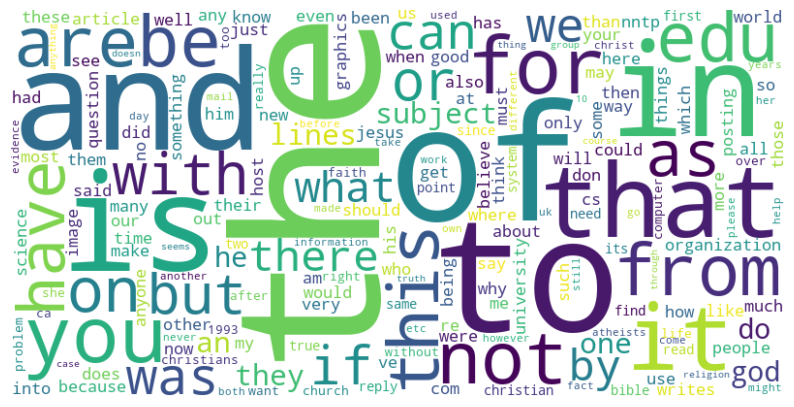

In [149]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Step 1: count the number of times each term appears in each document.
term_frequencies = X_counts.sum(axis=0)  # count
term_frequencies = np.array(term_frequencies)[0]  # transform to array
terms = count_vect.get_feature_names_out() 

# Step 2: construct the word frequency dictionary
word_freq = {terms[i]: term_frequencies[i] for i in range(len(terms))}

# Step 3:  use WordCloud to construct the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Step 4: plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()

---

### 5.4 Attribute Transformation / Aggregation

In [150]:
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))

#[3, 8, 5, 2, 5, 8, 2, 5, 3, 2]

In [151]:
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
term_frequencies

array([134,  92,   1, ...,   1,   1,   1], dtype=int64)

In [152]:
term_frequencies[0] #sum of first term: 00

134

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_11172\2064051530.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90); # the first 300 frequencies


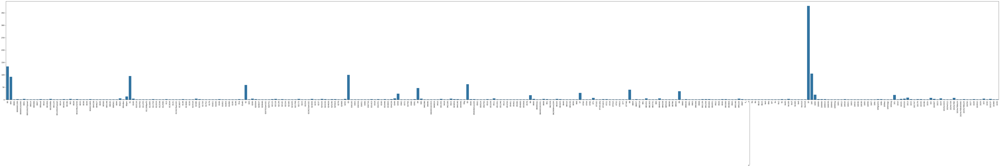

In [153]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], # the first 300 terms
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90); # the first 300 frequencies

---

### >>> **Exercise 12 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [154]:
# This code is to construct the dataframe which contains term and theirfrequencies

term_frequencies_df = pd.DataFrame({
    'Term': count_vect.get_feature_names_out(),  # Vocabulary
    'Frequency': term_frequencies  # frequencies
})

term_frequencies_df

,Term,Frequency
0,00,134
1,000,92
2,0000,1
3,0000001200,2
4,000005102000,1
...,...,...
35783,zyxel,2
35784,zz,1
35785,zzz,1
35786,ªl,1


In [155]:
# This code is to select the first 300 terms and 300 frequencies of the dataframe

df_term = term_frequencies_df['Term'].iloc[:300]
df_frquency = term_frequencies_df['Frequency'].iloc[:300]

df = pd.DataFrame({'Term': df_term, 'Frequency': df_frquency})
df

,Term,Frequency
0,00,134
1,000,92
2,0000,1
3,0000001200,2
4,000005102000,1
...,...,...
295,103,4
296,1030,1
297,103237,3
298,10368,1


In [156]:
# This code is to plot the dataframe by using plotly

import plotly.express as px

fig = px.bar(df, x='Term', y='Frequency') # use plotly to plot the bar chart (bar)

fig.show()

---

### >>> **Exercise 13 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


Now, I can sort the term frequencies and select the top 100 terms to visualize, making the visualization meaningful.

In [157]:
# This code is to sort the dataframe by the frequency.

term_frequencies_df_sort  = term_frequencies_df.sort_values(by=['Frequency'], ascending=False)
term_frequencies_df_sort

,Term,Frequency
32142,the,29825
23610,of,17660
32493,to,17222
4992,and,13017
18474,is,12343
...,...,...
24661,pcb,1
24662,pcboard,1
24663,pccvm,1
24664,pcd7,1


In [158]:
# This code is to select the first 100 terms and 100 frequencies of the sorted dataframe

df_term_sort = term_frequencies_df_sort['Term'].iloc[:100]
df_frquency_sort = term_frequencies_df_sort['Frequency'].iloc[:100]

df_sort = pd.DataFrame({'Term': df_term_sort, 'Frequency': df_frquency_sort})
df_sort

,Term,Frequency
32142,the,29825
23610,of,17660
32493,to,17222
4992,and,13017
18474,is,12343
...,...,...
34229,very,805
15576,good,805
6430,believe,803
33858,use,772


In [159]:
# This code is to plot the dataframe by using plotly

import plotly.express as px

fig = px.bar(df_sort, x='Term', y='Frequency') # use plotly to plot the bar chart (bar)
fig.update_traces(marker_color='#009393') 

fig.show()

---

### >>> **Exercise 14 (take home):** 

In [162]:
# This code is to construct the dataframe which contains term and theirfrequencies

term_frequencies_df = pd.DataFrame({
    'Term': count_vect.get_feature_names_out(),  # Vocabulary
    'Frequency': term_frequencies  # frequencies
})

# This code is to sort the dataframe by the frequency

term_frequencies_df_sort  = term_frequencies_df.sort_values(by=['Frequency'], ascending=False)
term_frequencies_df_sort

,Term,Frequency
32142,the,29825
23610,of,17660
32493,to,17222
4992,and,13017
18474,is,12343
...,...,...
24661,pcb,1
24662,pcboard,1
24663,pccvm,1
24664,pcd7,1


In [163]:
# This code is to select the first 300 terms and 300 frequencies of the sorted dataframe

df_term_sort_300 = term_frequencies_df_sort['Term'].iloc[:300]
df_frquency_sort_300 = term_frequencies_df_sort['Frequency'].iloc[:300]

df_sort_300 = pd.DataFrame({'Term': df_term_sort_300, 'Frequency': df_frquency_sort_300})
df_sort_300

,Term,Frequency
32142,the,29825
23610,of,17660
32493,to,17222
4992,and,13017
18474,is,12343
...,...,...
35604,yet,274
8713,claim,274
19787,last,270
21033,mark,269


In [164]:
# This code is to plot the dataframe by using plotly

import plotly.express as px

fig = px.bar(df_sort_300, x='Term', y='Frequency')  # use plotly to plot the bar chart (bar)
fig.update_traces(marker_color='#009393') 

# I don't want the X and Y axis' name
fig.update_layout(
    xaxis_title="",  
    yaxis_title="",  
)

fig.show()

In [165]:
# We can add a frequency line to the bar chart that shows the frequency of each term

import plotly.express as px
import plotly.graph_objects as go

fig = px.bar(df_sort_300, x='Term', y='Frequency')  # use plotly to plot the bar chart (bar)
fig.update_traces(marker_color='#009393') 

fig.add_trace(go.Scatter(x = df_sort_300['Term'], y = df_sort_300['Frequency'],
    mode='lines', name='Frequency line', line=dict(color='#FF5809'),  
))

# I don't want the X and Y axis' name
fig.update_layout(
    xaxis_title="",  
    yaxis_title="",  
)

fig.show()

# We can find that the term with the highest frequency is 'the'

---

In [166]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_11172\893370012.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ChienYu\AppData\Local\Temp\ipykernel_11172\893370012.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



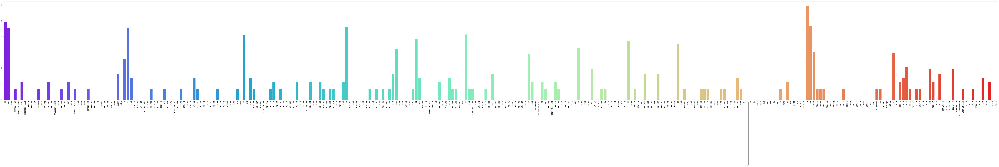

In [167]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300], palette="rainbow")
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

# The first 300 frequencies of the dataframe.

### >>> **Exercise 15 (take home):** 
You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

In [168]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

In [169]:
# This code is to construct the dataframe which contains term and theirfrequencies

term_frequencies_df = pd.DataFrame({
    'Term': count_vect.get_feature_names_out(),  # Vocabulary
    'Frequency': term_frequencies_log  # frequencies
})

term_frequencies_df

,Term,Frequency
0,00,4.897840
1,000,4.521789
2,0000,0.000000
3,0000001200,0.693147
4,000005102000,0.000000
...,...,...
35783,zyxel,0.693147
35784,zz,0.000000
35785,zzz,0.000000
35786,ªl,0.000000


In [170]:
# This code is to sort the dataframe by the frequency

term_frequencies_df_sort  = term_frequencies_df.sort_values(by=['Frequency'], ascending=False)
term_frequencies_df_sort

,Term,Frequency
32142,the,10.303102
23610,of,9.779057
32493,to,9.753943
4992,and,9.474011
18474,is,9.420844
...,...,...
24661,pcb,0.000000
24662,pcboard,0.000000
24663,pccvm,0.000000
24664,pcd7,0.000000


In [171]:
# This code is to select the first 300 terms and 300 frequencies of the sorted dataframe

df_term_sort_300 = term_frequencies_df_sort['Term'].iloc[:300]
df_frquency_sort_300 = term_frequencies_df_sort['Frequency'].iloc[:300]

df_sort_300 = pd.DataFrame({'Term': df_term_sort_300, 'Frequency': df_frquency_sort_300})
df_sort_300

,Term,Frequency
32142,the,10.303102
23610,of,9.779057
32493,to,9.753943
4992,and,9.474011
18474,is,9.420844
...,...,...
35604,yet,5.613128
8713,claim,5.613128
19787,last,5.598422
21033,mark,5.594711


In [172]:
# We can add a frequency line to the bar chart that shows the frequency of each term

import plotly.express as px
import plotly.graph_objects as go

fig = px.bar(df_sort_300, x='Term', y='Frequency')  # use plotly to plot the bar chart (bar)
fig.update_traces(marker_color='#009393') 

fig.add_trace(go.Scatter(x = df_sort_300['Term'], y = df_sort_300['Frequency'],
    mode='lines', name='Frequency line', line=dict(color='#FF5809'),  
))

# I don't want the X and Y axis' name
fig.update_layout(
    xaxis_title="",  
    yaxis_title="",  
)

fig.show()

# We can find that the term with the highest frequency is 'the'
# We can find that the differences between the terms are less noticeable than when we don't take the logarithm of the frequency."

###  Finding frequent patterns

In [173]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['category_name'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['text'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [174]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=0 #You can change it from 0 to 3 # category_number = 0
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category comp.graphics:


,00,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


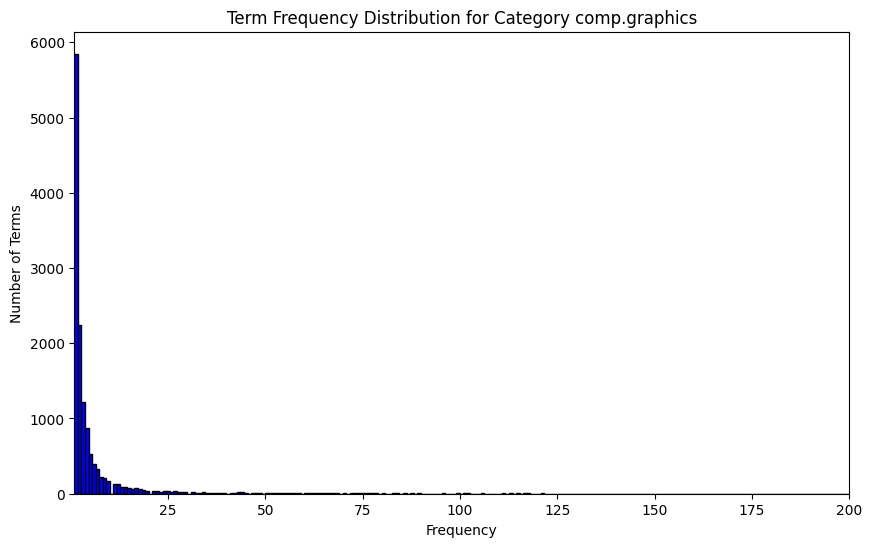

In [175]:
# Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

In [176]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order # [::-1] means descending

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms) # top 5%

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

# There are 687 terms in top 5% in the 'comp.graphics' category.

Category: comp.graphics
Number of terms in top 5%: 687
Filtered terms: ['the', 'to', 'of', 'and', 'is', 'in', 'for', 'it', 'from', 'you', 'edu', 'that', 'on', 'this', 'or', 'be', 'with', 'have', 'lines', 'can', 'subject', 'are', 'graphics', 'if', 'organization', 'image', 'as', 'not', 'but', 'at', 'there', 'com', 'an', 'any', 'will', 'by', 'university', 're', 'about', 'some', 'posting', 'file', 'do', 'all', 'would', 'host', 'jpeg', 'what', 'so', 'nntp', 'has', 'files', 'which', 'one', 'also', 'me', 'use', 'software', 'was', 'my', 'images', 'writes', 'other', 'article', 'out', 'data', 'program', 'know', 'like', 'version', 'more', 'color', 'ftp', 'your', 'get', 'computer', 'don', '3d', 'does', 'no', 'mail', 'format', 'they', 'available', 'need', 'we', 'ca', 'thanks', 'just', 'bit', 'gif', 'how', 'help', 'am', 'please', 'package', 'pub', 'anyone', 'very', 'information', 'using', 'code', 'line', 'than', 'find', 'system', 'only', 'time', 'where', '24', 'windows', 'good', 'uk', 'cs', 'display

Here we can explore the frequencies of the **top 5%** words:

In [178]:
sorted_counts #We can see the frequencies sorted in a descending order

array([4537, 2775, 2470, ...,    1,    1,    1], dtype=int64)

In [177]:
sorted_indices #This are the indices corresponding to the words after being sorted in a descending order

array([12266, 12390,  9021, ...,  7181,  7183,  6877], dtype=int64)

In [179]:
filt_term_document_dfs[categories[category_number]].loc[:,'the'].sum(axis=0) 
# There are 4537 terms which is 'the'.

4537

In [180]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy() # sum(axis=0) means sum up the column, sum(axis=1) means sum up the row

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

# There are 137 terms in bottom 1% in the 'comp.graphics' category.

Category: comp.graphics
Number of terms in bottom 1%: 137
Filtered terms: ['initworld', 'jkpg', 'jiu1', 'jiu', 'jfreund', 'jeremy', 'jena', 'jem', 'jele', 'jeffrey', 'jbalgley', 'jasper', 'jancene', 'jaguar', 'jaggies', 'jagged', 'jaclyn', 'jacky', 'ja', 'ixos', 'ixels', 'ix', 'ivr', 'ivnorm', 'iv2scn', 'itri', 'itor', 'itnsg1', 'jman', 'itn', 'jna', 'joes', 'jump', 'juelin', 'judge', 'juan', 'jroberts', 'jr', 'jpsrc4', 'jplpost', 'jpgs', 'jpg95', 'jpg75', 'jpg5o', 'jpg50', 'jpg25', 'jpegv4', 'jpegsrc4', 'jpeged', 'jpeg4bin', 'jpeg4386', 'journalix', 'josephson', 'jong', 'joint', 'join', 'johnm', 'johnl', 'jogle', 'jobs', 'jun', 'ithil', 'iterate', 'ipsc2', 'ipcs', 'ipa', 'ious', 'ior', 'ions', 'iol', 'io', 'invited', 'invisible', 'investment', 'investigator', 'investigation', 'investigating', 'inversion', 'inventing', 'invent', 'invariants', 'invariably', 'inumerable', 'intuitive', 'introducing', 'intricacies', 'intervention', 'interval', 'interpretor', 'interpretations', 'ipu', 'iter

Here we can explore the frequencies of the **bottom 1%** words:

In [181]:
sorted_counts #We can see the frequencies sorted in an ascending order

array([   1,    1,    1, ..., 2470, 2775, 4537], dtype=int64)

In [182]:
sorted_indices #This are the indices corresponding to the words after being sorted in an ascending order

array([ 6877,  7183,  7181, ...,  9021, 12390, 12266], dtype=int64)

In [183]:
filt_term_document_dfs[categories[category_number]].loc[:,'l14h11'].sum(axis=0) #Here we can sum up the column corresponding to the bottom 1% words, we just specify which one first.
# There is just 1 term which is 'l14h11'.

1

In [184]:
category_number=0 # It can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]



For category comp.graphics we filter the following words:
Bottom 1.0% words: 
initworld    1
jkpg         1
jiu1         1
jiu          1
jfreund      1
            ..
lab2         1
laaksone     1
l4v          1
l300         1
l14h11       1
Length: 137, dtype: int64
Top 5.0% words: 
40               27
distributed      27
open             27
multi            27
getting          27
               ... 
is             1751
and            2382
of             2470
to             2775
the            4537
Length: 687, dtype: int64

For category soc.religion.christian we filter the following words:
Bottom 1.0% words: 
disparate       1
expose          1
explosive       1
resisting       1
exploitation    1
               ..
fence           1
feminist        1
remarriage      1
remarried       1
remeber         1
Length: 138, dtype: int64
Top 5.0% words: 
pagan        36
claims       36
gave         36
parts        36
jr           37
          ...  
that       4393
and        4409
to        

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### >>> **Exercise 16 (take home):** 
Review the words that were filtered in each category and comment about the differences and similarities that you can see.

In [185]:
filt_term_document_dfs[categories[category_number]]

,00,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [186]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order # [::-1] means descending

sorted_counts

array([4537, 2775, 2470, ...,    1,    1,    1], dtype=int64)

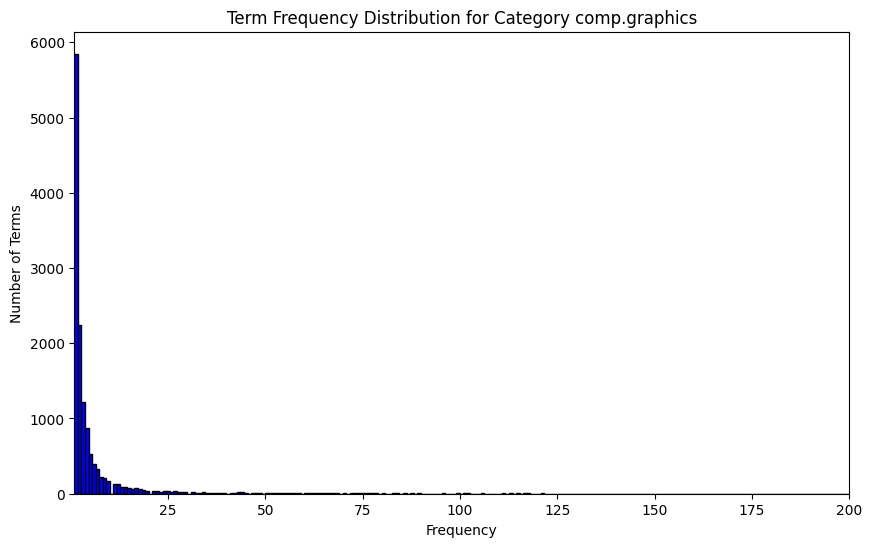

In [187]:
# This is the original term-document, which doesn't filtered the top 5% and bottom 1% frequency
# We can notice that the frequency of the words are quite different
# The top 5% frequency words appear about five to six thousands times
# The bottom 1% frequency words appear about just 1 to 2 times

# Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

In [188]:
term_document_dfs[categories[category_number]]

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [189]:
category_number=0 #You can change it from 0 to 3
word_counts = term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices_ = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts_ = np.sort(word_counts)[::-1]  # Sort frequencies in descending order # [::-1] means descending

sorted_counts_

# array([27, 27, 27, ...,  1,  1,  1], dtype=int64)
# The difference between the top frequency and the bottom frequency is very small (just 26) in the filtered term-document

array([27, 27, 27, ...,  1,  1,  1], dtype=int64)

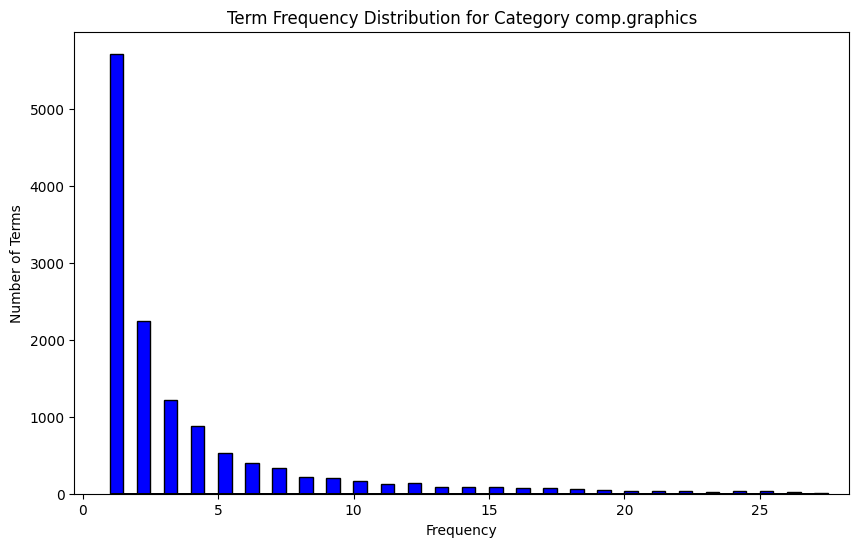

In [190]:
# This is the filtered term-document, which filtered the top 5% and bottom 1% frequency
# The difference between the top frequency and the bottom frequency is very small (just 26) in the filtered term-document
# The difference between the original term-document and the filtered term-document is quite large
# By filtering out those words, we can concentrate on more relevant and significant terms that reflect the core themes of the dataset
# Common words (like "the" and "and") may not contribute to the specific context or meaning of the text
# Rare terms may represent noise rather than meaningful contents
# The filtered term-document is more informative than the original term-document, and the visualization is clearer

# Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, width = 0.5, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
# plt.xlim(1, 200)
plt.show()

Database size (total no of transactions) : 584
Number of items : 12932
Minimum Transaction Size : 4
Average Transaction Size : 56.41267123287671
Maximum Transaction Size : 2063
Standard Deviation Transaction Size : 152.5206450557005
Variance in Transaction Sizes : 23302.44862132569
Sparsity : 0.995637745806304


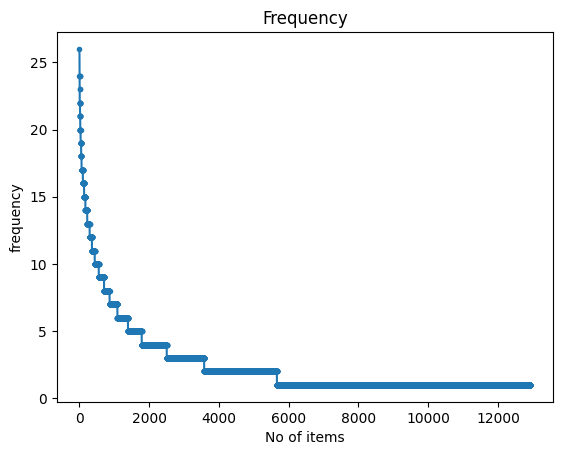

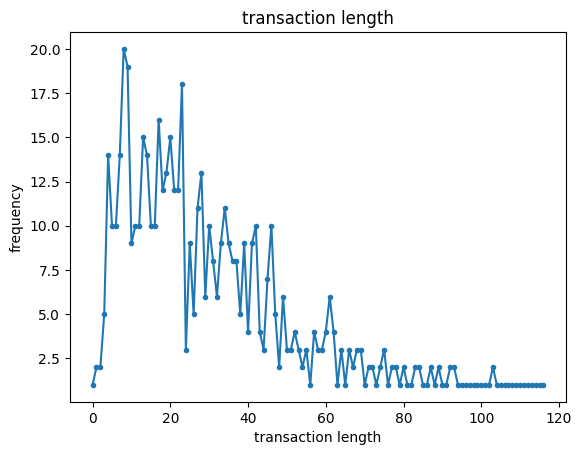

In [191]:
# Computer Graphics Dataset

from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 594
Number of items : 15283
Minimum Transaction Size : 9
Average Transaction Size : 74.55892255892256
Maximum Transaction Size : 1070
Standard Deviation Transaction Size : 115.43440452043433
Variance in Transaction Sizes : 13347.572407606134
Sparsity : 0.9951214471923757


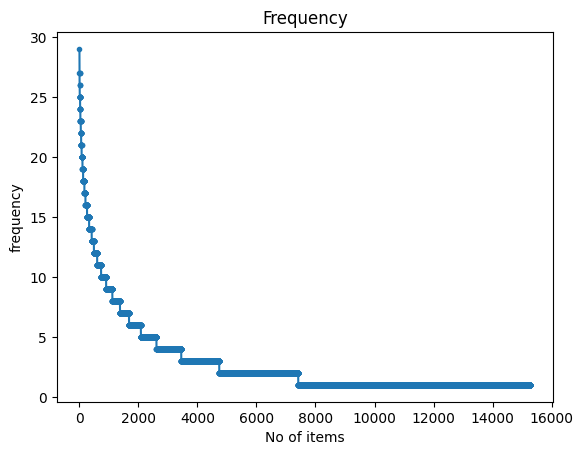

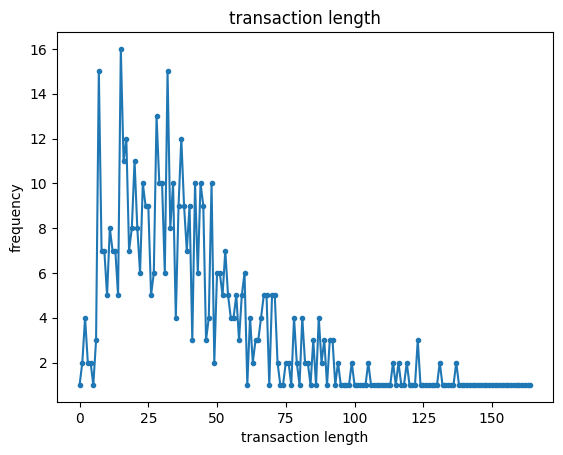

In [ ]:
# Scientific Medicine Dataset

from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_sci_med.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 599
Number of items : 13041
Minimum Transaction Size : 2
Average Transaction Size : 77.04507512520868
Maximum Transaction Size : 460
Standard Deviation Transaction Size : 62.384260554199
Variance in Transaction Sizes : 3898.3039849023735
Sparsity : 0.9940920884038641


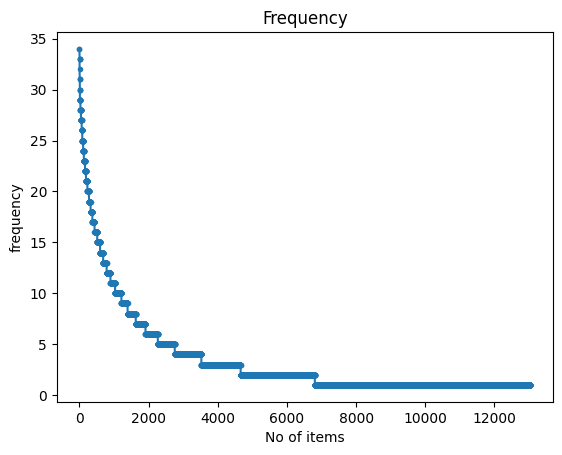

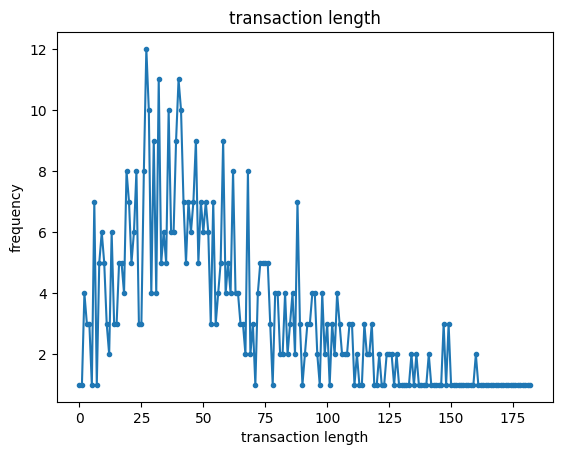

In [ ]:
# Social Religion Christian Dataset

from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_soc_religion_christian.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 480
Number of items : 11250
Minimum Transaction Size : 5
Average Transaction Size : 75.59791666666666
Maximum Transaction Size : 1395
Standard Deviation Transaction Size : 105.33869380396925
Variance in Transaction Sizes : 11119.405841162143
Sparsity : 0.9932801851851852


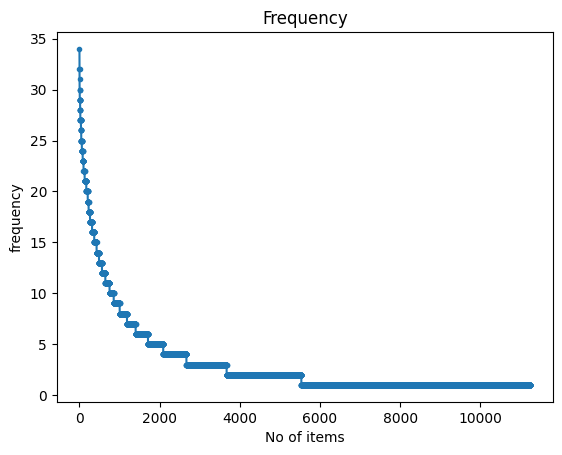

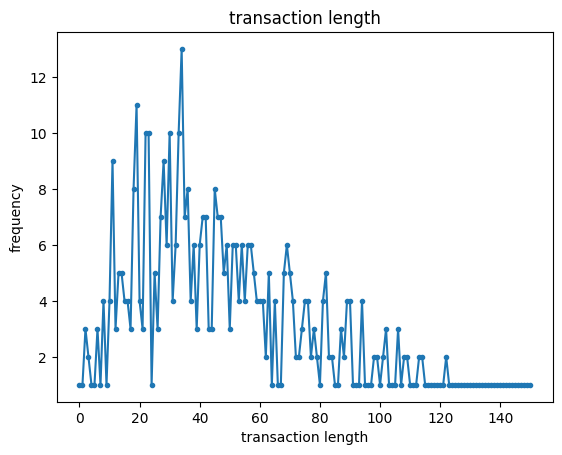

In [ ]:
# Alternative Atheism Dataset

from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_alt_atheism.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [ ]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9 # minimum support # only item combinations that appear in at least 9 transactions will be considered frequent patterns
obj1 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine() # Mining frequent patterns
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.20342564582824707


In [ ]:
obj1.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_sci_med_minSup9.txt') #save the patterns
frequentPatternsDF_sci_med

,Patterns,Support
0,leave,9
1,swell,9
2,color,9
3,confused,9
4,learning,9
...,...,...
9995,means,27
9996,haven,27
9997,happen,27
9998,originator,27


In [ ]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 0.16270089149475098


In [ ]:
obj2.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_alt_atheism_minSup9.txt') #save the patterns
frequentPatternsDF_alt_atheism

,Patterns,Support
0,choices,9
1,corp,9
2,hausmann,9
3,hausmann maddi,9
4,kids,9
...,...,...
4671,date,31
4672,date gmt,19
4673,stay,32
4674,snm6394,32


In [ ]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.7687575817108154


In [ ]:
obj3.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup9.txt') #save the patterns
frequentPatternsDF_comp_graphics

,Patterns,Support
0,individual,9
1,certain,9
2,hall,9
3,mike,9
4,vr,9
...,...,...
33569,life,24
33570,ideas,24
33571,feel,24
33572,tried,24


In [ ]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.2828075885772705


In [ ]:
obj4.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_soc_religion_minSup9.txt') #save the patterns
frequentPatternsDF_soc_religion_christian

,Patterns,Support
0,latest,9
1,san,9
2,seven,9
3,schools,9
4,chose,9
...,...,...
11208,34,33
11209,institute,33
11210,ways,33
11211,oh,34


In [ ]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

                        Patterns  Support
19911                        gov       33
19912                  institute       33
57158                    snm6394       32
19910                       form       31
57156                    deleted       30
...                          ...      ...
54045  axes funds motss matching        9
54044   boy funds motss matching        9
54043    boy axes motss matching        9
54042    et funds motss matching        9
0                          swell        9

[57159 rows x 2 columns]
Number of patterns discarded: 2304


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2254,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2255,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### >>> **Exercise 17 (take home):** 
Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

**FAE Top-K**\
Using FAE Top-k and setting k values = 500, 1000, and 1500.

In [ ]:
# when k = 500, the runtime is 1.056382 seconds.
# when k = 1000, the runtime is 3.311174 seconds.
# when k = 1500, the runtime is 8.546733 seconds.
# Even though k increases arithmetically, the runtime grows geometrically.

from PAMI.frequentPattern.topk.FAE import FAE
import pandas as pd

k_values = [500, 1000, 1500]
results = [] 
iFile = 'E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv'

for k in k_values:
    obj_topk = FAE(iFile=iFile, k=k)
    obj_topk.mine()  
    frequentPatternsDF_topk = obj_topk.getPatternsAsDataFrame()  
    runtime = obj_topk.getRuntime()  #measure the runtime
    results.append((k, len(frequentPatternsDF_topk), runtime))  # save the results
    print('k: ' + str(k))
    print('Total No of patterns: ' + str(len(frequentPatternsDF_topk)))   #print the total number of patterns
    print('Runtime: ' + str(runtime))

results_df = pd.DataFrame(results, columns=['k', 'Total Patterns', 'Runtime'])
print(results_df)

 TopK frequent patterns were successfully generated using FAE algorithm.
k: 500
Total No of patterns: 500
Runtime: 1.0563817024230957
 TopK frequent patterns were successfully generated using FAE algorithm.
k: 1000
Total No of patterns: 1000
Runtime: 3.311173677444458
 TopK frequent patterns were successfully generated using FAE algorithm.
k: 1500
Total No of patterns: 1500
Runtime: 8.546732902526855
      k  Total Patterns   Runtime
0   500             500  1.056382
1  1000            1000  3.311174
2  1500            1500  8.546733


**MaxFPGrowth**\
Using FPGrowth Algorithm and setting minSup = 3, 6, and 9.

In [ ]:
# when minSup = 3, the total No of patterns is 6872.
# when minSup = 6, the total No of patterns is 1340.
# when minSup = 9, the total No of patterns is 660.
# We obtain that when minSup is setted higher, the total No of patterns is lower.
# when minSup = 3, the runtime is 21.2775 seconds.
# when minSup = 6, the runtime is 0.4838 seconds.
# when minSup = 9, the runtime is 0.1556 seconds.
# It means that as minSup increases, the number of patterns retained decreases.
# The runtime decreases as minSup increases, which is trivial.

from PAMI.frequentPattern.maximal import MaxFPGrowth as alg
minSup_values=[3,6,9]

for minSup in minSup_values:
    obj3 = alg.MaxFPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv', minSup=minSup)
    obj3.mine()
    frequentPatternsDF_comp_graphics= obj3.getPatterns()
    print('minSup: ' + str(minSup))
    print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
    print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime
    obj3.save(f'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup{minSup}.txt') #save the patterns

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup: 3
Total No of patterns: 6872
Runtime: 21.27751326560974
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup: 6
Total No of patterns: 1340
Runtime: 0.4838111400604248
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup: 9
Total No of patterns: 660
Runtime: 0.1556074619293213


In [ ]:
import pandas as pd

file_path = 'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup3.txt'

try:
    df = pd.read_csv(file_path, header=None, encoding='utf-8')
    df.columns = ['Patterns']
    print(df)  

except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")


                                               Patterns
0     due\tbytes\tresponsible\t000\topinion\t640x480...
1                                                bag:3 
2                                       garbo\tuwasa:3 
3     wrong\t200\tresponsible\t000\tumn\t480\t640\tt...
4                            responsible\t000\tessex:3 
...                                                 ...
6867                                 didn\twondering:3 
6868                         feel\twrong\tpersonally:3 
6869                                  wrong\tcorrect:3 
6870                                   life\tcorrect:3 
6871                                     maybe\tlife:4 

[6872 rows x 1 columns]


In [ ]:
import pandas as pd

file_path = 'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup6.txt'

try:
    df = pd.read_csv(file_path, header=None, encoding='utf-8')
    df.columns = ['Patterns']
    print(df)  

except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")

                                       Patterns
0                                 tim\tbrock:6 
1                                       face:6 
2                                     pardon:6 
3     removal\tsilent\tassassin\tcellar\ttsa:6 
4                                   creative:6 
...                                         ...
1335                               feel\tapr:8 
1336                                   didn:22 
1337                                  wrong:23 
1338                                  tried:24 
1339                                  ideas:24 

[1340 rows x 1 columns]


In [ ]:
import pandas as pd

file_path = 'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup9.txt'

try:
    df = pd.read_csv(file_path, header=None, encoding='utf-8')
    df.columns = ['Patterns']
    print(df)  

except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")

                     Patterns
0                      tim:9 
1                   option:9 
2           rumours\t68070:9 
3                     chip:9 
4    rumours\tmcmains\tunt:9 
..                        ...
655                 wrong:23 
656                 tried:24 
657                 ideas:24 
658                  life:24 
659                 maybe:26 

[660 rows x 1 columns]


---

### 5.5 Dimensionality Reduction

In [ ]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

In [ ]:
X_pca_tdm.shape

(2257, 2)

In [ ]:
X_tsne_tdm.shape

(2257, 2)

In [ ]:
X_umap_tdm.shape

(2257, 2)

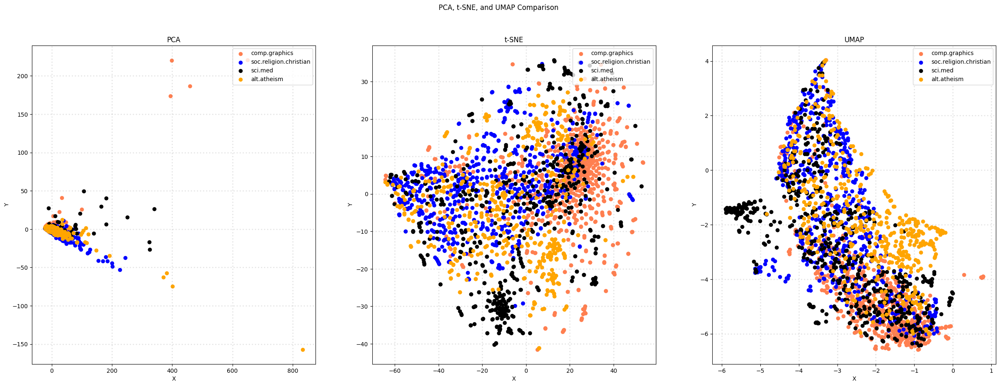

In [ ]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

In [ ]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

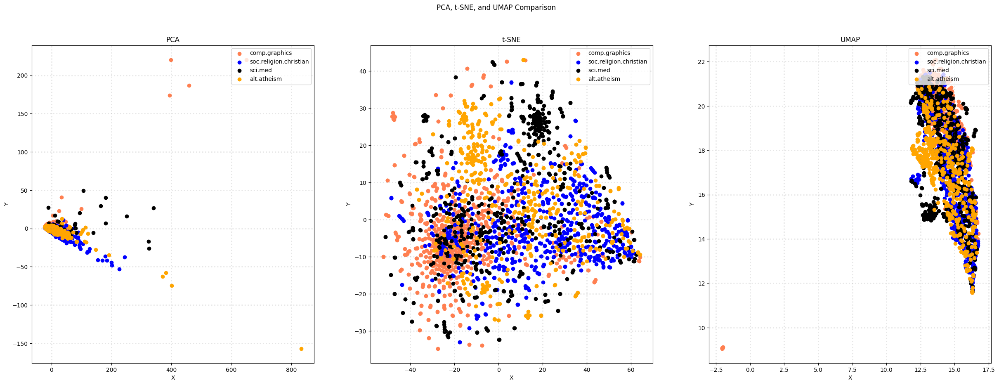

In [ ]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

### >>> Exercise 18 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [ ]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm_ = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_ = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm_ = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

In [ ]:
X_pca_tdm_.shape

(2257, 3)

In [ ]:
X_tsne_tdm_.shape

(2257, 3)

In [ ]:
X_umap_tdm_.shape

(2257, 3)

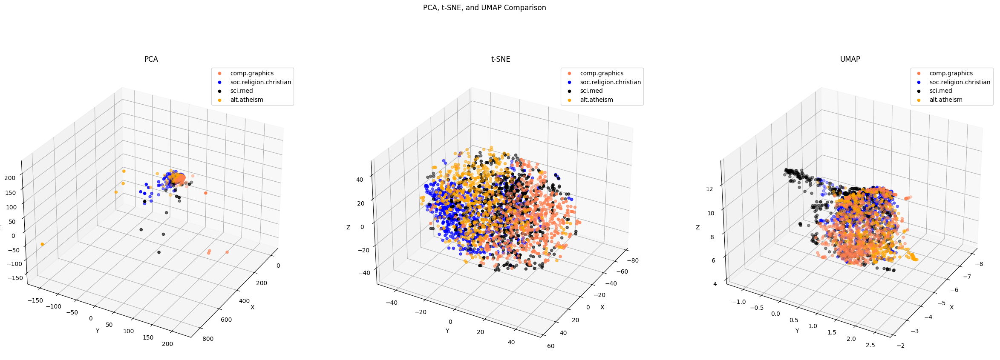

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Prepare color and category data
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

# Create 3D subplots for PCA, t-SNE, and UMAP
fig = plt.figure(figsize=(30, 10))  # Create a large figure for 3D plots
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_3d_scatter(ax, X_reduced, title, elevation=30, azimuth=30):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        
        if X_reduced.shape[1] > 2:
            zs = X_reduced[X['category_name'] == category][:, 2]
        else:
            zs = np.zeros_like(xs)  
            
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    ax.view_init(elevation,azimuth)

# Create 3D axes for each method
ax1 = fig.add_subplot(131, projection='3d')  # PCA plot
ax2 = fig.add_subplot(132, projection='3d')  # t-SNE plot
ax3 = fig.add_subplot(133, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP
plot_3d_scatter(ax1, X_pca_tdm_, 'PCA')
plot_3d_scatter(ax2, X_tsne_tdm_, 't-SNE')
plot_3d_scatter(ax3, X_umap_tdm_, 'UMAP')

plt.show()

# It is the 3D scatter plot that shows the difference between the 3 methods
# Since the data is scattered in space, a single perspective may not provide a clear view. 
# Adjusting both vertical and horizontal angles is needed to better distinguish the categories.

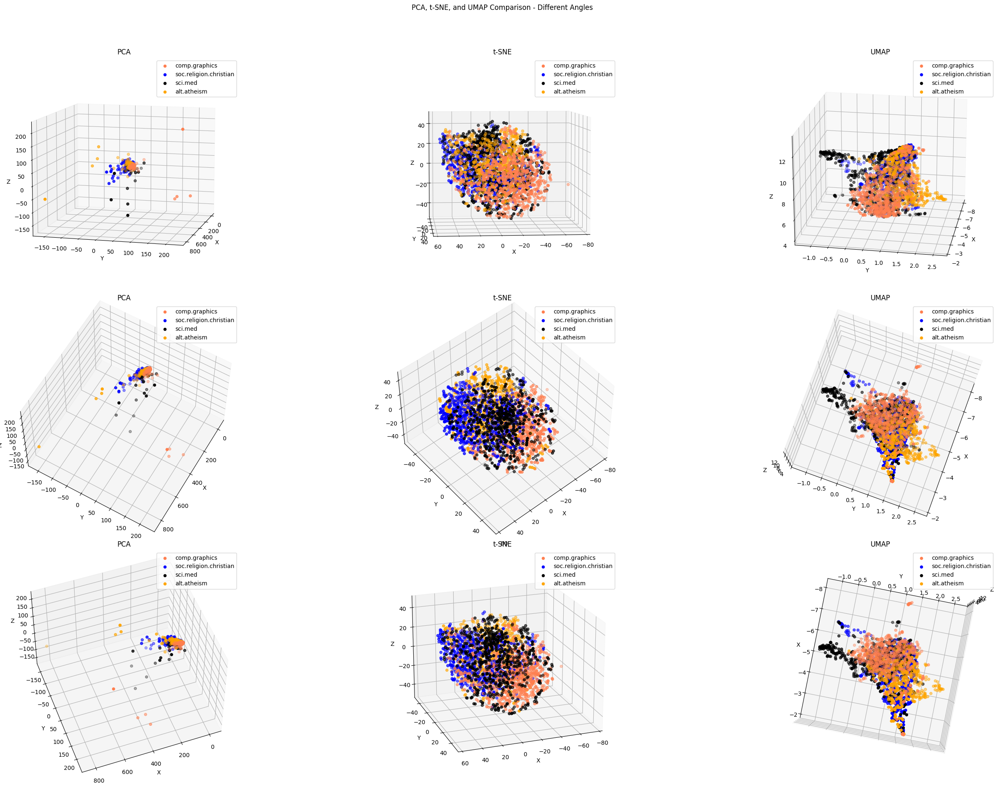

In [ ]:
# Create 3D subplots for PCA, t-SNE, and UMAP in a 3x3 layout
fig2 = plt.figure(figsize=(30, 20))
fig2.suptitle('PCA, t-SNE, and UMAP Comparison - Different Angles')

# Create new 3D axes for each method in a 3x3 grid
ax4_1 = fig2.add_subplot(331, projection='3d')  # PCA plot
ax5_1 = fig2.add_subplot(332, projection='3d')  # t-SNE plot
ax6_1 = fig2.add_subplot(333, projection='3d')  # UMAP plot

ax4_2 = fig2.add_subplot(334, projection='3d')  # PCA plot
ax5_2 = fig2.add_subplot(335, projection='3d')  # t-SNE plot
ax6_2 = fig2.add_subplot(336, projection='3d')  # UMAP plot

ax4_3 = fig2.add_subplot(337, projection='3d')  # PCA plot
ax5_3 = fig2.add_subplot(338, projection='3d')  # t-SNE plot
ax6_3 = fig2.add_subplot(339, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP with different angles
plot_3d_scatter(ax4_1, X_pca_tdm_, 'PCA', elevation=10, azimuth=15)  # PCA at angle 1
plot_3d_scatter(ax5_1, X_tsne_tdm_, 't-SNE', elevation=5, azimuth=85)
plot_3d_scatter(ax6_1, X_umap_tdm_, 'UMAP', elevation=20, azimuth=10)

plot_3d_scatter(ax4_2, X_pca_tdm_, 'PCA', elevation=60, azimuth=30)  # PCA at angle 2
plot_3d_scatter(ax5_2, X_tsne_tdm_, 't-SNE', elevation=50, azimuth=50)
plot_3d_scatter(ax6_2, X_umap_tdm_, 'UMAP', elevation=80, azimuth=20)

plot_3d_scatter(ax4_3, X_pca_tdm_, 'PCA', elevation=50, azimuth=70)  # PCA at angle 3
plot_3d_scatter(ax5_3, X_tsne_tdm_, 't-SNE', elevation=20, azimuth=70)
plot_3d_scatter(ax6_3, X_umap_tdm_, 'UMAP', elevation=90, azimuth=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
plt.show()

# The clearest PCA plot can be observed at the angle settings of elevation = 10 and azimuth = 15.
# The clearest t-SNE plot can be observed at the angle settings of elevation=50 and azimuth=50.
# The clearest UMAP plot can be observed at the angle settings of elevation=90 and azimuth=10.

In [ ]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug_ = PCA(n_components=3).fit_transform(augmented_df.values)
X_tsne_aug_ = TSNE(n_components=3).fit_transform(augmented_df.values)
X_umap_aug_ = umap.UMAP(n_components=3).fit_transform(augmented_df.values)


In [ ]:
X_pca_aug_.shape

(2257, 3)

In [ ]:
X_tsne_aug_.shape

(2257, 3)

In [ ]:
X_umap_aug_.shape

(2257, 3)

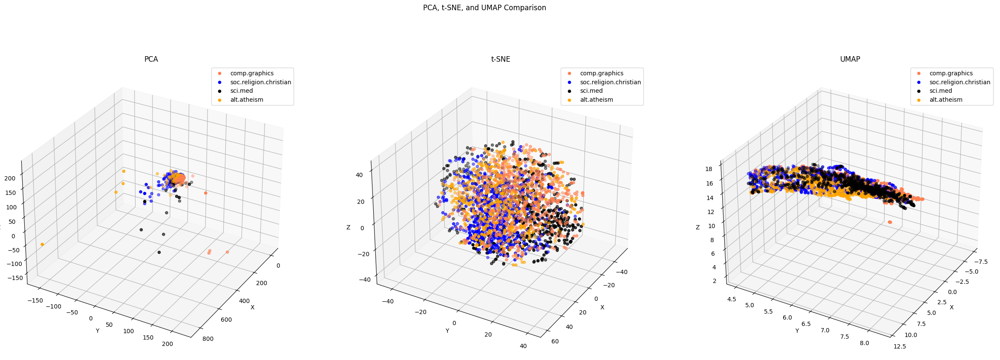

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Prepare color and category data
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

# Create 3D subplots for PCA, t-SNE, and UMAP
fig = plt.figure(figsize=(30, 10))  # Create a large figure for 3D plots
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_3d_scatter(ax, X_reduced, title, elevation=30, azimuth=30):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        
        if X_reduced.shape[1] > 2:
            zs = X_reduced[X['category_name'] == category][:, 2]
        else:
            zs = np.zeros_like(xs)  
            
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    ax.view_init(elevation,azimuth)

# Create 3D axes for each method
ax1 = fig.add_subplot(131, projection='3d')  # PCA plot
ax2 = fig.add_subplot(132, projection='3d')  # t-SNE plot
ax3 = fig.add_subplot(133, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP
plot_3d_scatter(ax1, X_pca_aug_, 'PCA')
plot_3d_scatter(ax2, X_tsne_aug_, 't-SNE')
plot_3d_scatter(ax3, X_umap_aug_, 'UMAP')

plt.show()

# It is the 3D scatter plot that shows the difference between the 3 methods
# Since the data is scattered in space, a single perspective may not provide a clear view. 
# Adjusting both vertical and horizontal angles is needed to better distinguish the categories.

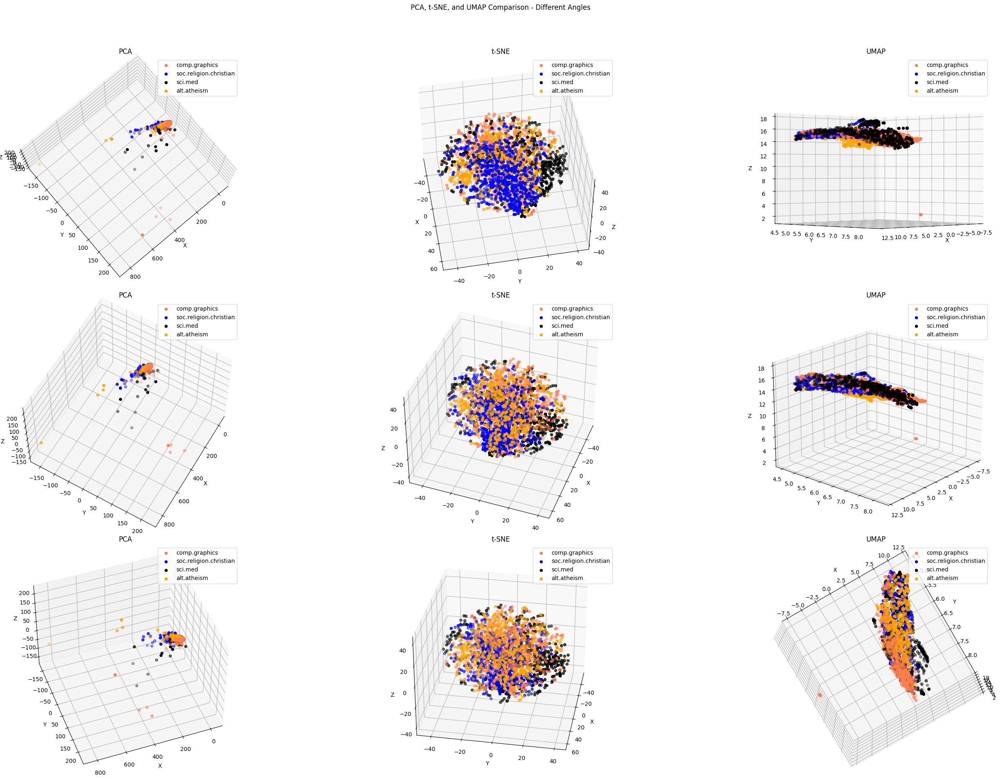

In [ ]:
# Create 3D subplots for PCA, t-SNE, and UMAP in a 3x3 layout
fig2 = plt.figure(figsize=(30, 20))
fig2.suptitle('PCA, t-SNE, and UMAP Comparison - Different Angles')

# Create new 3D axes for each method in a 3x3 grid
ax4_1 = fig2.add_subplot(331, projection='3d')  # PCA plot
ax5_1 = fig2.add_subplot(332, projection='3d')  # t-SNE plot
ax6_1 = fig2.add_subplot(333, projection='3d')  # UMAP plot

ax4_2 = fig2.add_subplot(334, projection='3d')  # PCA plot
ax5_2 = fig2.add_subplot(335, projection='3d')  # t-SNE plot
ax6_2 = fig2.add_subplot(336, projection='3d')  # UMAP plot

ax4_3 = fig2.add_subplot(337, projection='3d')  # PCA plot
ax5_3 = fig2.add_subplot(338, projection='3d')  # t-SNE plot
ax6_3 = fig2.add_subplot(339, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP with different angles
plot_3d_scatter(ax4_1, X_pca_aug_, 'PCA', elevation=80, azimuth=50)  # PCA at angle 1
plot_3d_scatter(ax5_1, X_tsne_aug_, 't-SNE', elevation=50, azimuth=-10)
plot_3d_scatter(ax6_1, X_umap_aug_, 'UMAP', elevation=0, azimuth=45)

plot_3d_scatter(ax4_2, X_pca_aug_, 'PCA', elevation=60, azimuth=30)  # PCA at angle 2
plot_3d_scatter(ax5_2, X_tsne_aug_, 't-SNE', elevation=40, azimuth=20)
plot_3d_scatter(ax6_2, X_umap_aug_, 'UMAP', elevation=20, azimuth=40)

plot_3d_scatter(ax4_3, X_pca_aug_, 'PCA', elevation=45, azimuth=70)  # PCA at angle 3
plot_3d_scatter(ax5_3, X_tsne_aug_, 't-SNE', elevation=30, azimuth=10)
plot_3d_scatter(ax6_3, X_umap_aug_, 'UMAP', elevation=-80, azimuth=-60)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
plt.show()

# The clearest PCA plot can be observed at the angle settings of elevation = 45 and azimuth = 70.
# The clearest t-SNE plot can be observed at the angle settings of elevation=50 and azimuth=-10.
# The clearest UMAP plot can be observed at the angle settings of elevation=-80 and azimuth=-60.

---

### 5.6 Discretization and Binarization

In [ ]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [ ]:
mlb = preprocessing.LabelBinarizer()

In [ ]:
mlb.fit(X.category)

LabelBinarizer()

In [ ]:
X['bin_category'] = mlb.transform(X['category']).tolist()

In [ ]:
X[0:9]

,text,category,category_name,unigrams,tokenized_text,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","{Subject:, Organization:, way, into, HP, M.P.C...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","{inside, as, rendered., Subject:, Organization...","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","{comforting,, you., working, ups?, being, it, ...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","{NL, Letteren,, books/articles(, the, From:, p...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","{SC, kingdom, as, king, Subject:, Organization...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...","{claim,, agree, as, >Christians, (Steve, Subje...","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...","{Conditt, as, are,, puts, Subject:, Organizati...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...","{counter., Becoming, it, dip,, people, wierd, ...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...","{other, Subject:, Organization:, were, (Gordon...","[0, 0, 1, 0]"


---

### >>> **Exercise 19 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [ ]:
# calculate the total number of unique categories in the category_name column.
# There are 4 categories: 'comp.graphics', 'soc.religion.christian', 'sci.med', and 'alt.atheism'.

unique_categories = X['category_name'].unique()
unique_categories

array(['comp.graphics', 'soc.religion.christian', 'sci.med',
       'alt.atheism'], dtype=object)

In [ ]:
mlb.fit(X.category_name)

LabelBinarizer()

In [ ]:
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()

In [ ]:
X[0:9]

,text,category,category_name,unigrams,tokenized_text,bin_category,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","{Subject:, Organization:, way, into, HP, M.P.C...","[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","{inside, as, rendered., Subject:, Organization...","[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","{comforting,, you., working, ups?, being, it, ...","[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","{NL, Letteren,, books/articles(, the, From:, p...","[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","{SC, kingdom, as, king, Subject:, Organization...","[0, 0, 0, 1]","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...","{claim,, agree, as, >Christians, (Steve, Subje...","[0, 0, 0, 1]","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...","{Conditt, as, are,, puts, Subject:, Organizati...","[0, 0, 0, 1]","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...","{counter., Becoming, it, dip,, people, wierd, ...","[0, 0, 1, 0]","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...","{other, Subject:, Organization:, were, (Gordon...","[0, 0, 1, 0]","[0, 0, 1, 0]"


In [ ]:
X

,text,category,category_name,unigrams,tokenized_text,bin_category,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","{Subject:, Organization:, way, into, HP, M.P.C...","[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","{inside, as, rendered., Subject:, Organization...","[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","{comforting,, you., working, ups?, being, it, ...","[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","{NL, Letteren,, books/articles(, the, From:, p...","[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","{SC, kingdom, as, king, Subject:, Organization...","[0, 0, 0, 1]","[0, 0, 0, 1]"
...,...,...,...,...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med,"[From, :, roos, @, Operoni.Helsinki.FI, (, Chr...","{Biotechnology, /, cortical, you, appreciate, ...","[0, 0, 1, 0]","[0, 0, 1, 0]"
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med,"[From, :, mhollowa, @, ic.sunysb.edu, (, Micha...","{Huntington,, Bob, Anne, transplant, month's, ...","[0, 0, 1, 0]","[0, 0, 1, 0]"
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med,"[From, :, sasghm, @, theseus.unx.sas.com, (, G...","{677-8000, experience, it, (since, people, ins...","[0, 0, 1, 0]","[0, 0, 1, 0]"
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med,"[From, :, Dan, Wallach, <, dwallach, @, cs.ber...","{opinion, Windows, bars, Archive-name:, swelli...","[0, 0, 1, 0]","[0, 0, 1, 0]"


---

## 6. Data Exploration

Sometimes you need to take a peek at your data to understand the relationships in your dataset. Here, we will focus in a similarity example. Let's take 3 documents and compare them.

In [ ]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = X.iloc[50] # the index 50
random_record_1 = random_record_1['text']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = X.iloc[100]
random_record_2 = random_record_2['text']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = X.iloc[150]
random_record_3 = random_record_3['text']
document_to_transform_3.append(random_record_3)

Let's look at our emails.

In [ ]:
print(document_to_transform_1) # check the text
print(document_to_transform_2)
print(document_to_transform_3)

['From: ab@nova.cc.purdue.edu (Allen B) Subject: Re: TIFF: philosophical significance of 42 Organization: Purdue University Lines: 39  In article <prestonm.735400848@cs.man.ac.uk> prestonm@cs.man.ac.uk (Martin   Preston) writes: > Why not use the PD C library for reading/writing TIFF files? It took me a > good 20 minutes to start using them in your own app.  I certainly do use it whenever I have to do TIFF, and it usually works very well.  That\'s not my point.  I\'m >philosophically< opposed to it because of its complexity.  This complexity has led to some programs\' poor TIFF writers making some very bizarre files, other programs\' inability to load TIFF images (though they\'ll save them, of course), and a general inability to interchange images between different environments despite the fact they all think they understand TIFF.  As the saying goes, "It\'s not me I\'m worried about- it\'s all the >other<  assholes out there!"  I\'ve had big trouble with misuse and abuse of TIFF over 

In [ ]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.608862
Cosine Similarity using count bw 1 and 3: 0.622050
Cosine Similarity using count bw 2 and 3: 0.565566
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


C:\Users\ChienYu\AppData\Local\Temp\ipykernel_19816\452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_19816\452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_19816\452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_19816\452772485.py:17: DeprecationWarning:

Conversion of an array with ndim >

---

## 7. Data Classification

In [ ]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(X[['category', 'category_name']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, X['category'], test_size=0.3, random_state=42)

In [ ]:
X_train

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,zvi,zvonko,zwart,zyeh,zyklon,zyxel,zz,zzz,ªl,íålittin
634,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
322,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1725,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
266,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1138,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1638,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1095,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1130,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1294,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X_test

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,zvi,zvonko,zwart,zyeh,zyklon,zyxel,zz,zzz,ªl,íålittin
561,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
440,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1513,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1360,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
259,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1552,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
331,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
194,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9660766961651918

Classification Report:
                         precision    recall  f1-score   support

           alt.atheism     0.9535    0.9535    0.9535       129
         comp.graphics     0.9540    0.9822    0.9679       169
               sci.med     0.9839    0.9683    0.9760       189
soc.religion.christian     0.9683    0.9581    0.9632       191

              accuracy                         0.9661       678
             macro avg     0.9649    0.9655    0.9651       678
          weighted avg     0.9663    0.9661    0.9661       678



In [ ]:
#Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(X[['category', 'category_name']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, X['category'], test_size=0.3, random_state=42)

In [ ]:
X_train

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
634,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
322,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1725,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
266,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1138,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1638,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1095,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1130,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1294,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X_test

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
561,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
440,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1513,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1360,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
259,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1552,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
331,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
194,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9734513274336283

Classification Report:
                         precision    recall  f1-score   support

           alt.atheism     0.9837    0.9380    0.9603       129
         comp.graphics     0.9940    0.9822    0.9881       169
               sci.med     0.9789    0.9841    0.9815       189
soc.religion.christian     0.9444    0.9791    0.9614       191

              accuracy                         0.9735       678
             macro avg     0.9753    0.9709    0.9728       678
          weighted avg     0.9739    0.9735    0.9735       678



---
---

# The new dataset

## Data

In [6]:
import numpy as np
import pandas as pd

X = pd.read_csv("hf://datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")
X

# There are two columns: sentiment and comment.

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...
...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,....."
1496,not nostalgia,it's sad this is such a beautiful song when yo...
1497,not nostalgia,"Dear Friend, I think age and time is not that ..."
1498,nostalgia,I was born in 1954 and started to be aware of ...


In [7]:
category = {
    'nostalgia': 1,
    'not nostalgia': 0
}
X['category'] = X['sentiment'].map(category)
X

# Add a new column: category with values 0 and 1 corresponding to 'not nostalgia' and 'nostalgia'.

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1


In [8]:
# To select all the documents in 'nostalgia' category with comment length > 100
X.query('sentiment == "nostalgia" and comment.str.len() > 100')

,sentiment,comment,category
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
5,nostalgia,"Every time I heard this song as a child, I use...",1
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1
...,...,...,...
1482,nostalgia,"Love the song, brings me back to a better plac...",1
1491,nostalgia,real music...how i miss those days...brings ba...,1
1492,nostalgia,i used to cry over this song cause i had a boy...,1
1498,nostalgia,I was born in 1954 and started to be aware of ...,1


In [9]:
# select one sample every 10 rows, and take the first 5 rows and print them out.
print(X[X['sentiment'] == 'nostalgia'].iloc[::10][0:5]) 

    sentiment                                            comment  category
1   nostalgia  The mist beautiful voice ever I listened to hi...         1
18  nostalgia  My Grandparents had a pub in the 1970's, this ...         1
32  nostalgia  I remember my Mom listening to Jim over and ov...         1
50  nostalgia  If I remember correctly, this song came out af...         1
71  nostalgia  Gosh does this bring back memories. Nearly eve...         1


## Data Mining using Pandas

In [10]:
X.isnull() # This code is to check the missing values

,sentiment,comment,category
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
1495,False,False,False
1496,False,False,False
1497,False,False,False
1498,False,False,False


In [11]:
import pandas as pd
import helpers.data_mining_helpers as dmh

X.isnull().apply(lambda x: dmh.check_missing_values(x))

# There is no missing value in the dataset

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


Let us check how many duplicates we have in our current dataset. Here is the line of code that checks for duplicates; it is very similar to the `isnull` function that we used to check for missing values. 

In [12]:
X.duplicated() # This code is to check the duplicate records(重複行)

0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool

We can also check the sum of duplicate records by simply doing:

In [13]:
sum(X.duplicated())

# There is a duplicate record.

1

In [14]:
X.drop_duplicates(keep='first', inplace=True) # inplace applies changes directly on our dataframe
# To remove all duplicate rows from the DataFrame without keeping any of the duplicates.

In [15]:
len(X)

1499

## Data Preprocessing

In [16]:
X_sample = X.sample(n=1000, random_state=42) #random state

In [17]:
print(len(X)) 
print(len(X_sample))

# There are 1499 rows in the original dataset, while 1000 rows were sampled.

1499
1000


In [18]:
# The difference between index in X and X_sample
print("Index in X:", X.index)
print("Index in X_sample:", X_sample.index)

Index in X: Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       1490, 1491, 1492, 1493, 1494, 1495, 1496, 1497, 1498, 1499],
      dtype='int64', length=1499)
Index in X_sample: Index([1117, 1396,  423,  414,  452,  862, 1064,  742, 1272,  260,
       ...
       1010, 1192,   68,  885, 1264,  367,  506,  851, 1315,  384],
      dtype='int64', length=1000)


The following indexes are present in X but not in X_sample.

In [19]:
# The difference between index in X and X_sample
# The following indexes are present in X but not in X_sample.
X.index.difference(X_sample.index)

Index([   1,    4,    8,   11,   13,   14,   16,   17,   18,   19,
       ...
       1463, 1469, 1472, 1475, 1482, 1483, 1484, 1496, 1497, 1498],
      dtype='int64', length=499)

The following is the difference of the statistical data between X and X_sample.\
Although X_sample contains less data,, there is almost no difference.

In [20]:
# The following is the difference of the statistical data between X and X_sample.
print("Statistic data of X:")
X.describe()

Statistic data of X:


,category
count,1499.000000
mean,0.500334
std,0.500167
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


In [21]:
print("Statistic data of X_sample:")
X_sample.describe()
# Although X_sample contains less data,, there is almost no difference.

Statistic data of X_sample:


,category
count,1000.000000
mean,0.498000
std,0.500246
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


Let's do something cool here while we are working with sampling! Let us look at the distribution of categories in both the sample and original dataset. Let us visualize and analyze the disparity between the two datasets. To generate some visualizations, we are going to use `matplotlib` python library. With matplotlib, things are faster and compatability-wise it may just be the best visualization library for visualizing content extracted from dataframes and when using Jupyter notebooks. Let's take a loot at the magic of `matplotlib` below.

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

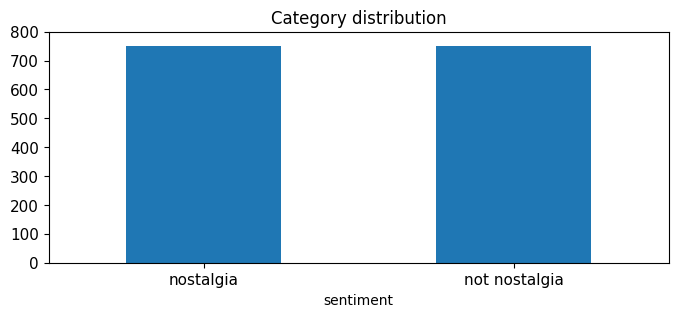

In [23]:
print(X.sentiment.value_counts())

# plot barchart for X
X.sentiment.value_counts().plot(kind = 'bar', # bar chart
                                title = 'Category distribution',
                                ylim = [0, 800],        
                                rot = 0, fontsize = 11, figsize = (8,3))

# There are 750 documents in nostalgia category, while 749 in not nostalgia category.

sentiment
not nostalgia    502
nostalgia        498
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

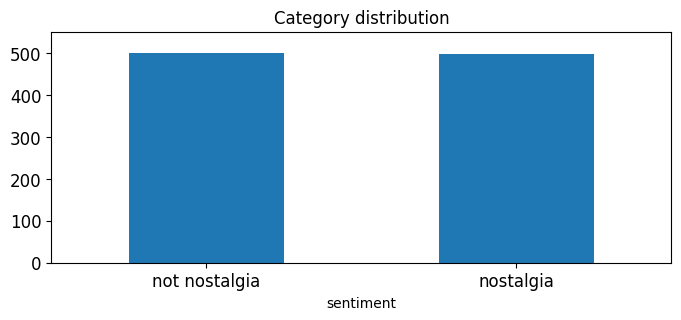

In [24]:
upper_bound = max(X_sample.sentiment.value_counts() + 50)
print(X_sample.sentiment.value_counts())

plt.style.use('default') # reset style

X_sample.sentiment.value_counts().plot(kind = 'bar',
                                        title = 'Category distribution',
                                        ylim = [0, upper_bound], 
                                        rot = 0, fontsize = 12, figsize = (8,3))

# There are 502 documents in nostalgia category, while 498 in not nostalgia category.

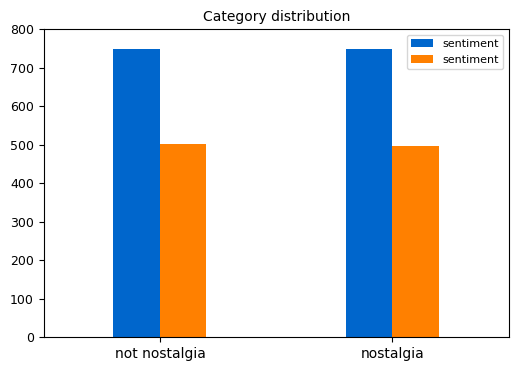

In [25]:
fig, ax = plt.subplots(figsize=(6, 4)) # the figure
upper_bound = max(X.sentiment.value_counts() + 50)
num_categories = len(X.sentiment.value_counts()) # calculate the number of categories

# plot barchart for X
X.sentiment.value_counts().plot(kind = 'bar', width=0.2, position=1, color = '#0066CC', rot = 0, fontsize = 11, ax=ax, label='sentiment')

# plot barchart for X_sample
X_sample.sentiment.value_counts().plot(kind = 'bar', width=0.2, position=0, color = '#FF8000', rot = 0, fontsize = 11, ax=ax, label='sentiment')

ax.set_title('Category distribution', fontsize=10)
ax.legend(prop={'size': 8}) # the size of the legend
ax.set_xlabel('')  # Remove the label of y-axis (the name of y-axis)
ax.tick_params(axis='x', labelsize=10) 
ax.tick_params(axis='y', labelsize=9)  
# ax.set_xlim(-0.5, len(X.sentiment.value_counts()) - 0.5)
ax.set_xlim( -0.5, num_categories - 0.5)
ax.set_ylim(0, upper_bound)

plt.show()

# The blue bar is the sentiment distribution of X.
# The orange bar is the sentiment distribution of X_sample.

In [26]:
import nltk

In [27]:
# takes a like a minute or two to process
X['unigrams'] = X['comment'].apply(lambda x: dmh.tokenize_text(x)) # This code is to tokenize the text

In [28]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.comment) #learn the vocabulary and return document-term matrix # Term Frequency Vector
print(X_counts[0])

  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  (0, 2328)	2
  (0, 245)	1
  (0, 3581)	1
  (0, 1591)	1
  (0, 2082)	1
  (0, 2974)	1
  (0, 573)	1
  (0, 593)	1
  (0, 3538)	1
  (0, 1347)	2
  (0, 1833)	1
  (0, 2671)	1
  (0, 3713)	2
  (0, 1272)	1
  (0, 2688)	1
  (0, 1125)	1
  (0, 2035)	1
  (0, 3278)	1
  (0, 2018)	1
  (0, 1964)	1


Now you can also see some examples of what each feature is based on their index in the vector:

In [29]:
analyze = count_vect.build_analyzer()
analyze("I am craving for a hawaiian pizza right now")

# tokenization, remove stop words (e.g i, a, the), create n-gram (or unigram)

['am', 'craving', 'for', 'hawaiian', 'pizza', 'right', 'now']

`count_vect.build_analyzer()`
 - Tokenization（詞彙標記化）
 - Remove Stop Words（移除停用詞）
 - Create N-gram（或 Unigram）

In [30]:
# How do we turn our array[0] comment document into a tokenized comment using the build_analyzer()?
analyze(X.comment[0]) # This code is to tokenize the comment and show the first comment

['he',
 'was',
 'singer',
 'with',
 'golden',
 'voice',
 'that',
 'love',
 'to',
 'hear',
 'all',
 'the',
 'time',
 'was',
 'his',
 'great',
 'fan',
 'at',
 'the',
 'age',
 'of',
 '16years',
 'in',
 'those',
 'days',
 'and',
 'still',
 'now',
 'although',
 'we',
 'have',
 'many',
 'singers',
 'now',
 'but',
 'can',
 'vouch',
 'for',
 'jim',
 'reeves',
 'all',
 'the',
 'time',
 'you',
 'feel',
 'relaxed',
 'emotional',
 'and',
 'loving',
 'thank',
 'you',
 'lord',
 'for',
 'his',
 'life']

Now let us look at the term-document matrix we built above.

In [31]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '000', '045', '07', '10', '100', '10m', '11', '11th', '12'],
      dtype=object)

In [32]:
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray() # toarray() converts sparse array to normal array

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [33]:
count_vect.get_feature_names_out()[0:1] # The forst term

array(['00'], dtype=object)

Show the fifth record.

In [34]:
# fifth_record = X_counts[4].toarray()
fifth_record = X_counts[4].toarray()[0]
fifth_record

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

Find the index of the term 1 in the fifth record.

In [35]:
fifth_1 = np.where(fifth_record == 1)[0] # Find the index of the term 1
fifth_1

array([1182, 1646, 1651, 1986, 2114, 2239, 2254, 2341, 2499, 2706, 3045,
       3336, 3622], dtype=int64)

In [36]:
words_in_fifth_record = [count_vect.get_feature_names_out()[i] for i in fifth_1]
words_in_fifth_record

['everyday',
 'him',
 'his',
 'listening',
 'me',
 'mum',
 'my',
 'of',
 'played',
 'reminds',
 'songs',
 'to',
 'who']

In [37]:
index_word_mapping = {i: count_vect.get_feature_names_out()[i] for i in range(len(count_vect.get_feature_names_out()))}

print("Index and corresponding words in the fifth record:")
for index in fifth_1:
    print(f"Index: {index}: Word: '{index_word_mapping[index]}'")

# it shows the index and corresponding words in the fifth record.

Index and corresponding words in the fifth record:
Index: 1182: Word: 'everyday'
Index: 1646: Word: 'him'
Index: 1651: Word: 'his'
Index: 1986: Word: 'listening'
Index: 2114: Word: 'me'
Index: 2239: Word: 'mum'
Index: 2254: Word: 'my'
Index: 2341: Word: 'of'
Index: 2499: Word: 'played'
Index: 2706: Word: 'reminds'
Index: 3045: Word: 'songs'
Index: 3336: Word: 'to'
Index: 3622: Word: 'who'


Combine X_counts and X_counts_nonzero.

In [38]:
import pandas as pd

# Calculate the total number of words in each document
X_counts_nonzero = (X_counts != 0).sum(axis=1)  # not 0
X_counts_df = pd.DataFrame({'Term Vector': [list(row) for row in X_counts.toarray()]}) # Term frequency vector
X_counts_nonzero_df = pd.DataFrame(X_counts_nonzero, columns=['Nonzero Count'])

# sort by the number of words
X_counts_df = pd.concat([X_counts_df, X_counts_nonzero_df], axis=1)
X_counts_df_sort = X_counts_df.sort_values(by='Nonzero Count', ascending=False) 

# The top 20 documents.
X_counts_df_sort_20 = X_counts_df_sort.head(20)['Term Vector'].tolist()

# The top 20 terms in the first 20 documents.
word_frequency = np.sum(np.array(X_counts_df_sort_20) != 0, axis=0)  # Count the number of times each term appears in the top 20 documents
top_20_words = np.argsort(word_frequency)[-20:][::-1]

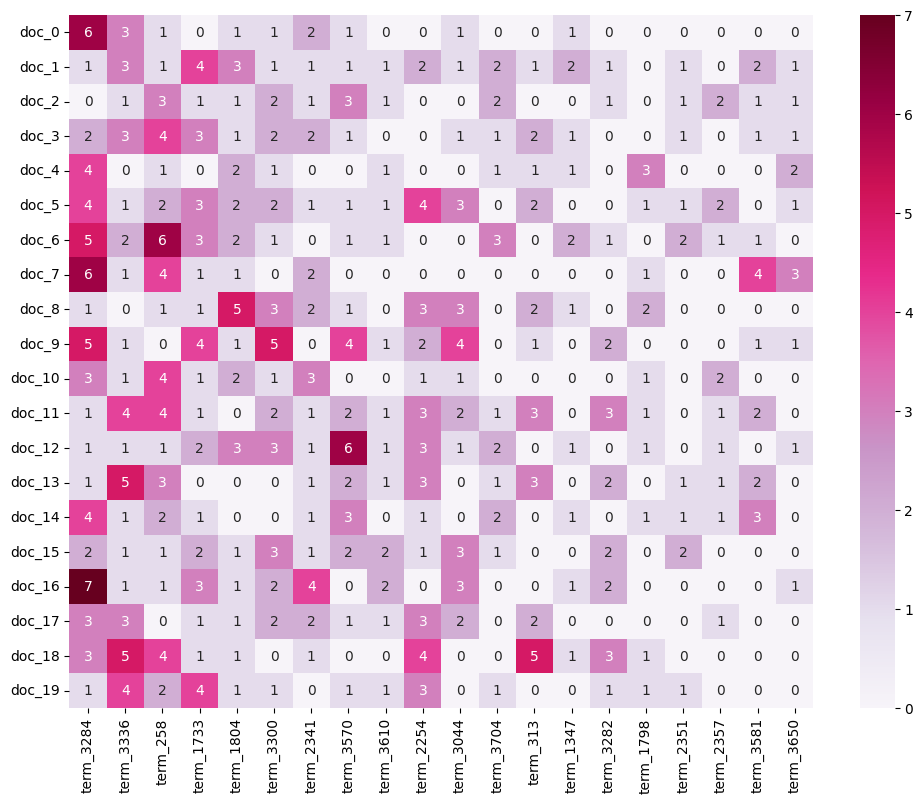

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

term_vectors = pd.DataFrame(X_counts_df_sort_20)  # The top 20 documents.
plot_z = term_vectors.iloc[:, top_20_words]  # The top 20 terms in the first 20 documents.
plot_z = plot_z.astype(int)

# Heatmap
plot_x = ["term_" + str(i) for i in top_20_words]  # The name of the first 20 terms.
plot_y = ["doc_" + str(i) for i in range(20)]  # The name of the first 20 documents.

df_todraw = pd.DataFrame(plot_z.values, columns=plot_x, index=plot_y)

plt.subplots(figsize=(12, 9))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=np.max(plot_z.values), 
                 annot=True, 
                 fmt='.0f')

plt.show()

# This time, the heatmap is much more informative.

Word cloud：

In [40]:
# We can also construct the word cloud to show.

# first twenty features only
plot_x_c = [str(i) for i in count_vect.get_feature_names_out()[0:20]] 
# This code is to show the first twenty terms

In [41]:
# obtain document index
plot_y_c = [str(i) for i in list(X.index)[0:20]] # X.index[how many documents]
# This code is to show the first twenty documents

In [42]:
plot_z_c = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z_c

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

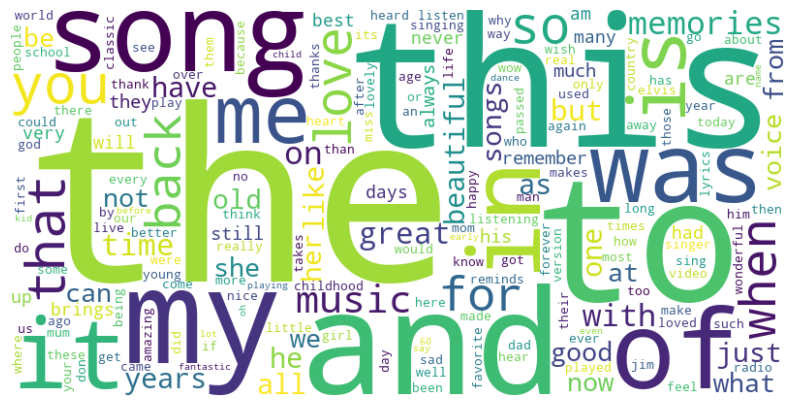

In [43]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Step 1: count the number of times each term appears in each document.
term_frequencies = X_counts.sum(axis=0)  # count
term_frequencies = np.array(term_frequencies)[0]  # transform to array
terms = count_vect.get_feature_names_out() 

# Step 2: construct the word frequency dictionary
word_freq = {terms[i]: term_frequencies[i] for i in range(len(terms))}

# Step 3:  use WordCloud to construct the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Step 4: plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()


---

In [44]:
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))

In [45]:
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
term_frequencies

array([1, 2, 1, ..., 1, 1, 1], dtype=int64)

In [46]:
term_frequencies[0] #sum of first term: 00

1

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\2064051530.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90); # the first 300 frequencies


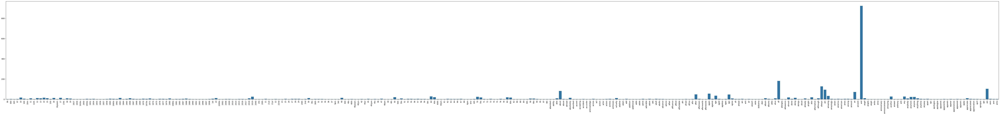

In [47]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], # the first 300 terms
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90); # the first 300 frequencies

In [48]:
# This code is to construct the dataframe which contains term and theirfrequencies

term_frequencies_df = pd.DataFrame({
    'Term': count_vect.get_feature_names_out(),  # Vocabulary
    'Frequency': term_frequencies  # frequencies
})
term_frequencies_df

,Term,Frequency
0,00,1
1,000,2
2,045,1
3,07,2
4,10,16
...,...,...
3725,yrs,5
3726,yuo,1
3727,yup,1
3728,zealand,1


In [49]:
# This code is to select the first 300 terms and 300 frequencies of the dataframe

df_term = term_frequencies_df['Term'].iloc[:300]
df_frquency = term_frequencies_df['Frequency'].iloc[:300]

df = pd.DataFrame({'Term': df_term, 'Frequency': df_frquency})
df

,Term,Frequency
0,00,1
1,000,2
2,045,1
3,07,2
4,10,16
...,...,...
295,apt,1
296,are,103
297,aren,4
298,arm,2


In [50]:
# This code is to plot the dataframe by using plotly

import plotly.express as px

fig = px.bar(df, x='Term', y='Frequency') # use plotly to plot the bar chart (bar)
fig.show()

In [51]:
# This code is to construct the dataframe which contains term and theirfrequencies

term_frequencies_df = pd.DataFrame({
    'Term': count_vect.get_feature_names_out(),  # Vocabulary
    'Frequency': term_frequencies  # frequencies
})

term_frequencies_df_sort  = term_frequencies_df.sort_values(by=['Frequency'], ascending=False)
df_term_sort = term_frequencies_df_sort['Term'].iloc[:100]
df_frquency_sort = term_frequencies_df_sort['Frequency'].iloc[:100]

df_sort = pd.DataFrame({'Term': df_term_sort, 'Frequency': df_frquency_sort})
df_sort

,Term,Frequency
3284,the,1351
3300,this,997
3336,to,937
258,and,923
2254,my,765
...,...,...
1584,has,71
1180,every,70
1713,if,68
1964,life,67


In [52]:
# This code is to plot the dataframe by using plotly.

import plotly.express as px

fig = px.bar(df_sort, x='Term', y='Frequency') # use plotly to plot the bar chart (bar)
fig.update_traces(marker_color='#009393') 

fig.show()

In [53]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\3727690890.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\3727690890.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



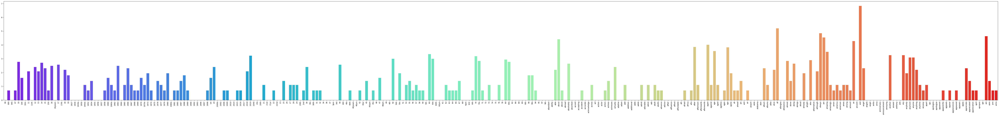

In [54]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300], palette="rainbow")
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

In [55]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

In [56]:
# This code is to construct the dataframe which contains term and theirfrequencies

term_frequencies_df = pd.DataFrame({
    'Term': count_vect.get_feature_names_out(),  # Vocabulary
    'Frequency': term_frequencies_log  # frequencies
})

term_frequencies_df

,Term,Frequency
0,00,0.000000
1,000,0.693147
2,045,0.000000
3,07,0.693147
4,10,2.772589
...,...,...
3725,yrs,1.609438
3726,yuo,0.000000
3727,yup,0.000000
3728,zealand,0.000000


In [57]:
# This code is to sort the dataframe by the frequency
term_frequencies_df_sort  = term_frequencies_df.sort_values(by=['Frequency'], ascending=False)

# This code is to select the first 300 terms and 300 frequencies of the sorted dataframe
df_term_sort_300 = term_frequencies_df_sort['Term'].iloc[:300]
df_frquency_sort_300 = term_frequencies_df_sort['Frequency'].iloc[:300]

df_sort_300 = pd.DataFrame({'Term': df_term_sort_300, 'Frequency': df_frquency_sort_300})
df_sort_300

,Term,Frequency
3284,the,7.208600
3300,this,6.904751
3336,to,6.842683
258,and,6.827629
2254,my,6.639876
...,...,...
2003,lol,2.833213
3295,things,2.833213
1068,during,2.833213
2375,original,2.833213


In [58]:
# We can add a frequency line to the bar chart that shows the frequency of each term

import plotly.express as px
import plotly.graph_objects as go

fig = px.bar(df_sort_300, x='Term', y='Frequency')  # use plotly to plot the bar chart (bar)
fig.update_traces(marker_color='#009393') 

fig.add_trace(go.Scatter(x = df_sort_300['Term'], y = df_sort_300['Frequency'],
    mode='lines', name='Frequency line', line=dict(color='#FF5809'),  
))

# I don't want the X and Y axis' name
fig.update_layout(
    xaxis_title="",  
    yaxis_title="",  
)

fig.show()

# We can find that the term with the highest frequency is 'the'
# We can find that the differences between the terms are less noticeable than when we don't take the logarithm of the frequency."

In [59]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [60]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=0 #You can change it from 0 to 1 # category_number = 0
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


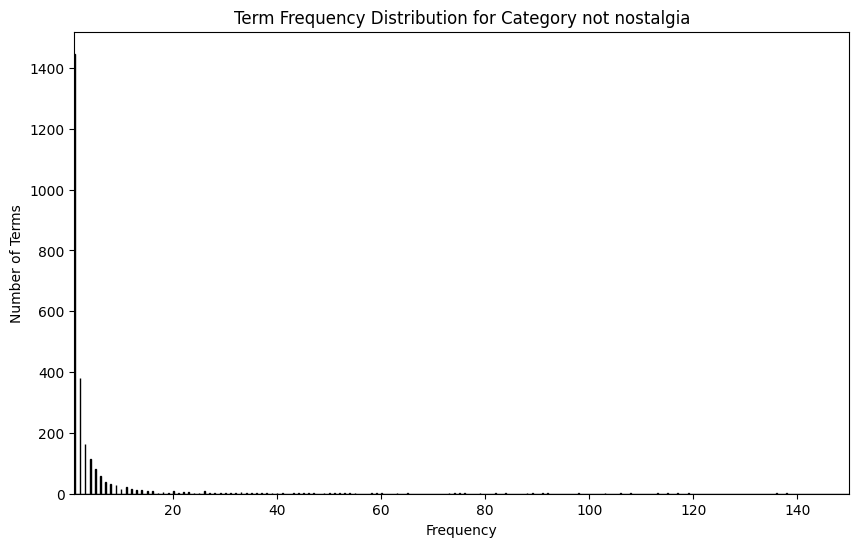

In [61]:
# Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 150)
plt.show()

In [62]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order # [::-1] means descending

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms) # top 5%

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'on', 'what', 'not', 'be', 'can', 'me', 'voice', 'just', 'as', 'beautiful', 'songs', 'her', 'time', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'now', 'never', 'much', 'about', 'who', 'really', 'if', 'we', 'more', 'best', 'ever', 'by', 'thank', 'think', 'would', 'only', 'how', 'don', 'still', 'has', 'very', 'there', 'am', 'out', 'him', 'these', 'could', 'up', 'old', 'hear', 'do', 'listen', 'an', 'singer', 'had', 'many', 'here', 'such', 'version', 'too', 'today', 'been', 'most', 'get', 'your', 'people', 'world', 'heard', 'man', 'video', 'some', 'sing', 'listening', 'real', 'years', 'were', 'than', 'singing', 'heart', 'nice', 'their', 'better', 'life', 'day', 'its', 'then', 'way', 'sad', 'those',

Here we can explore the frequencies of the **top 5%** words:

In [63]:
sorted_counts #We can see the frequencies sorted in a descending order

array([708, 452, 451, ...,   1,   1,   1], dtype=int64)

In [64]:
sorted_indices #This are the indices corresponding to the words after being sorted in a descending order

array([2276, 2290,  160, ..., 1509, 1510,    0], dtype=int64)

In [65]:
filt_term_document_dfs[categories[category_number]].loc[:,'the'].sum(axis=0) #Here we can sum up the column corresponding to the top 5% words, we just specify which one first.

708

In [66]:
category_number=0 #You can change it from 0 to 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy() # sum(axis=0) means sum up the column, sum(axis=1) means sum up the row

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['00', 'montgomery', 'money', 'monday', 'moments', 'mocking', 'mock', 'mitch', 'misunderstood', 'minute', 'minds', 'miller', 'monumental', 'millennium', 'miles', 'microphone', 'miami', 'meta', 'mess', 'merle', 'mendes', 'mended', 'melting', 'melt', 'melodica', 'milestone']


Here we can explore the frequencies of the **bottom 1%** words:

In [67]:
sorted_counts #We can see the frequencies sorted in an ascending order

array([  1,   1,   1, ..., 451, 452, 708], dtype=int64)

In [68]:
sorted_indices #This are the indices corresponding to the words after being sorted in an ascending order

array([   0, 1510, 1509, ...,  160, 2290, 2276], dtype=int64)

In [69]:
category_number=0 #You can change it from 0 to 1

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]


For category not nostalgia we filter the following words:
Bottom 1.0% words: 
00               1
montgomery       1
money            1
monday           1
moments          1
mocking          1
mock             1
mitch            1
misunderstood    1
minute           1
minds            1
miller           1
monumental       1
millennium       1
miles            1
microphone       1
miami            1
meta             1
mess             1
merle            1
mendes           1
mended           1
melting          1
melt             1
melodica         1
milestone        1
dtype: int64
Top 5.0% words: 
got         23
amazing     23
first       23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64

For category nostalgia we filter the following words:
Bottom 1.0% words: 
yup            1
gospel         1
rose           1
round          1
rousing        1
goodness       1
routine        1
row         

,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [70]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order # [::-1] means descending

sorted_counts

array([708, 452, 451, ...,   1,   1,   1], dtype=int64)

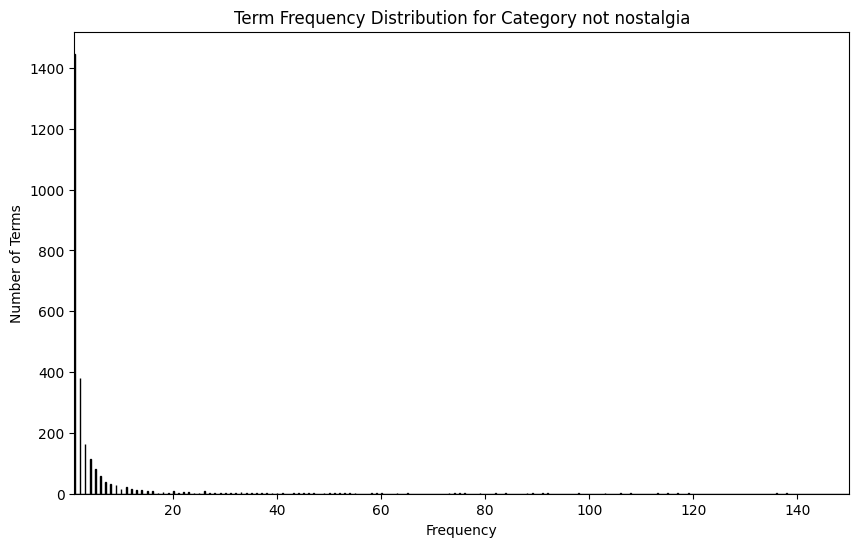

In [71]:
# This is the original term-document, which doesn't filtered the top 5% and bottom 1% frequency
# We can notice that the frequency of the words are quite different
# The top 5% frequency words appear about seven hundreds times
# The bottom 1% frequency words appear about just 1 to 2 times

# Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 150)
plt.show()

In [72]:
term_document_dfs[categories[category_number]]

,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [73]:
category_number=0 #You can change it from 0 to 1
word_counts = term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices_ = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts_ = np.sort(word_counts)[::-1]  # Sort frequencies in descending order # [::-1] means descending

sorted_counts_

array([23, 23, 22, ...,  1,  1,  1], dtype=int64)

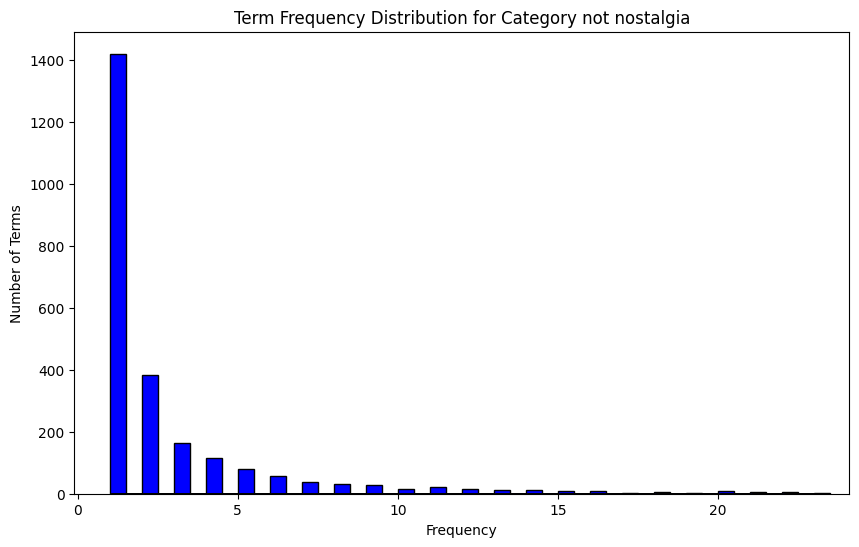

In [74]:
# Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, width = 0.5, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
# plt.xlim(1, 200)
plt.show()

Now let us look into the stats of our newly created transactional databases, we will observe the following:

- **Database Size (Total Number of Transactions)**: Total count of transactions in the dataset.

- **Number of Items**: Total count of unique items available across all transactions.

- **Minimum Transaction Size**: Smallest number of items in any transaction, indicating the simplest transaction.

- **Average Transaction Size**: Mean number of items per transaction, showing the typical complexity.

- **Maximum Transaction Size**: Largest number of items in a transaction, representing the most complex scenario.

- **Standard Deviation of Transaction Size**: Measures variability in transaction sizes; higher values indicate greater diversity.

- **Variance in Transaction Sizes**: Square of the standard deviation, providing a broader view of transaction size spread.

- **Sparsity**: Indicates the proportion of possible item combinations that do not occur, with values close to 1 showing high levels of missing combinations.

With regards to the graphs we will have: 

- **Item Frequency Distribution**
    - Y-axis (Frequency): Number of transactions an item appears in.
    - X-axis (Number of Items): Items ranked by frequency.

- **Transaction Length Distribution**
    - Y-axis (Frequency): Occurrence of transaction lengths.
    - X-axis (Transaction Length): Number of items per transaction.

In [75]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9 # minimum support # only item combinations that appear in at least 9 transactions will be considered frequent patterns
obj1 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine() # Mining frequent patterns
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.5393397808074951


In [76]:
obj1.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_sci_med_minSup9.txt') #save the patterns
frequentPatternsDF_sci_med

,Patterns,Support
0,leave,9
1,swell,9
2,color,9
3,confused,9
4,learning,9
...,...,...
9995,means,27
9996,haven,27
9997,happen,27
9998,originator,27


In [77]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 1.159264087677002


In [78]:
obj2.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_alt_atheism_minSup9.txt') #save the patterns
frequentPatternsDF_alt_atheism

,Patterns,Support
0,choices,9
1,corp,9
2,hausmann,9
3,hausmann maddi,9
4,kids,9
...,...,...
4671,date,31
4672,date gmt,19
4673,stay,32
4674,snm6394,32


In [79]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.3697361946105957


In [80]:
obj3.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup9.txt') #save the patterns
frequentPatternsDF_comp_graphics

,Patterns,Support
0,individual,9
1,certain,9
2,hall,9
3,mike,9
4,vr,9
...,...,...
33569,life,24
33570,ideas,24
33571,feel,24
33572,tried,24


In [81]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.6839139461517334


In [82]:
obj4.save('E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_soc_religion_minSup9.txt') #save the patterns
frequentPatternsDF_soc_religion_christian

,Patterns,Support
0,latest,9
1,san,9
2,seven,9
3,schools,9
4,chose,9
...,...,...
11208,34,33
11209,institute,33
11210,ways,33
11211,oh,34


Now that we've extracted the transactional patterns from our databases, the next step is to integrate them effectively with our initial data for further analysis. One effective method is to identify and use only the unique patterns that are specific to each category. This involves filtering out any patterns that are common across multiple categories.

The reason for focusing on **unique patterns** is that they can **significantly improve the classification process**. When a document contains these distinctive patterns, it provides clear, category-specific signals that help our model more accurately determine the document's category. This approach ensures that the patterns we use enhance the model's ability to distinguish between different types of content.

In [83]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

                        Patterns  Support
19911                        gov       33
19912                  institute       33
57158                    snm6394       32
19910                       form       31
57156                    deleted       30
...                          ...      ...
54045  axes funds motss matching        9
54044   boy funds motss matching        9
54043    boy axes motss matching        9
54042    et funds motss matching        9
0                          swell        9

[57159 rows x 2 columns]
Number of patterns discarded: 2304


We observed a significant number of patterns that were common across different categories, which is why we chose to discard them. The next step is to integrate these now category-specific patterns into our data. How will we do this? By converting the patterns into binary data within the columns of our document-term matrix. Specifically, we will check each document for the presence of each pattern. If a pattern is found in the document, we'll mark it with a '1'; if it's not present, we'll mark it with a '0'. This binary encoding allows us to effectively augment our data, enhancing its utility for subsequent classification tasks.

In [84]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['comment'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

**FAE Top-K**\
Using FAE Top-k and setting k values = 500, 1000, and 1500.

In [90]:
# when k = 500, the runtime is 2.188148 seconds.
# when k = 1000, the runtime is 4.518101 seconds.
# when k = 1500, the runtime is 10.531183 seconds.
# Even though k increases arithmetically, the runtime grows geometrically.

from PAMI.frequentPattern.topk.FAE import FAE
import pandas as pd

k_values = [500, 1000, 1500]
results = [] 
iFile = 'E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv'

for k in k_values:
    obj_topk = FAE(iFile=iFile, k=k)
    obj_topk.mine()  
    frequentPatternsDF_topk = obj_topk.getPatternsAsDataFrame()  
    runtime = obj_topk.getRuntime()  #measure the runtime
    results.append((k, len(frequentPatternsDF_topk), runtime))  # save the results
    print('k: ' + str(k))
    print('Total No of patterns: ' + str(len(frequentPatternsDF_topk)))   #print the total number of patterns
    print('Runtime: ' + str(runtime))

results_df = pd.DataFrame(results, columns=['k', 'Total Patterns', 'Runtime'])
print(results_df)

 TopK frequent patterns were successfully generated using FAE algorithm.
k: 500
Total No of patterns: 500
Runtime: 2.188148021697998
 TopK frequent patterns were successfully generated using FAE algorithm.
k: 1000
Total No of patterns: 1000
Runtime: 4.518101453781128
 TopK frequent patterns were successfully generated using FAE algorithm.
k: 1500
Total No of patterns: 1500
Runtime: 10.531182527542114
      k  Total Patterns    Runtime
0   500             500   2.188148
1  1000            1000   4.518101
2  1500            1500  10.531183


**MaxFPGrowth**\
Using FPGrowth Algorithm and setting minSup = 3, 6, and 9.

In [91]:
# when minSup = 3, the total No of patterns is 6872.
# when minSup = 6, the total No of patterns is 1340.
# when minSup = 9, the total No of patterns is 660.
# We obtain that when minSup is setted higher, the total No of patterns is lower.
# when minSup = 3, the runtime is 37.79116 seconds.
# when minSup = 6, the runtime is 0.58146 seconds.
# when minSup = 9, the runtime is 0.23828 seconds.
# It means that as minSup increases, the number of patterns retained decreases.
# The runtime decreases as minSup increases, which is trivial.

from PAMI.frequentPattern.maximal import MaxFPGrowth as alg
minSup_values=[3,6,9]

for minSup in minSup_values:
    obj3 = alg.MaxFPGrowth(iFile='E:/DMLab1/DM2024-Lab1-Master-main/td_freq_db_comp_graphics.csv', minSup=minSup)
    obj3.mine()
    frequentPatternsDF_comp_graphics= obj3.getPatterns()
    print('minSup: ' + str(minSup))
    print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
    print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime
    obj3.save(f'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup{minSup}.txt') #save the patterns

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup: 3
Total No of patterns: 6872
Runtime: 37.79116249084473
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup: 6
Total No of patterns: 1340
Runtime: 0.5814640522003174
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup: 9
Total No of patterns: 660
Runtime: 0.23827576637268066


In [87]:
import pandas as pd

file_path = 'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup3.txt'

try:
    df = pd.read_csv(file_path, header=None, encoding='utf-8')
    df.columns = ['Patterns']
    print(df)  

except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")


                                               Patterns
0     due\tbytes\tresponsible\t000\topinion\t640x480...
1                                                bag:3 
2                                       garbo\tuwasa:3 
3     wrong\t200\tresponsible\t000\tumn\t480\t640\tt...
4                            responsible\t000\tessex:3 
...                                                 ...
6867                                 didn\twondering:3 
6868                         feel\twrong\tpersonally:3 
6869                                  wrong\tcorrect:3 
6870                                   life\tcorrect:3 
6871                                     maybe\tlife:4 

[6872 rows x 1 columns]


In [88]:
import pandas as pd

file_path = 'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup6.txt'

try:
    df = pd.read_csv(file_path, header=None, encoding='utf-8')
    df.columns = ['Patterns']
    print(df)  

except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")

                                       Patterns
0                                 tim\tbrock:6 
1                                       face:6 
2                                     pardon:6 
3     removal\tsilent\tassassin\tcellar\ttsa:6 
4                                   creative:6 
...                                         ...
1335                               feel\tapr:8 
1336                                   didn:22 
1337                                  wrong:23 
1338                                  tried:24 
1339                                  ideas:24 

[1340 rows x 1 columns]


In [89]:
import pandas as pd

file_path = 'E:/DMLab1/DM2024-Lab1-Master-main/freq_patterns_comp_graphics_minSup9.txt'

try:
    df = pd.read_csv(file_path, header=None, encoding='utf-8')
    df.columns = ['Patterns']
    print(df)  

except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")

                     Patterns
0                      tim:9 
1                   option:9 
2           rumours\t68070:9 
3                     chip:9 
4    rumours\tmcmains\tunt:9 
..                        ...
655                 wrong:23 
656                 tried:24 
657                 ideas:24 
658                  life:24 
659                 maybe:26 

[660 rows x 1 columns]


---

[PCA Algorithm](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)
[t-SNE Algorithm](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)
[UMAP Algorithm](https://umap-learn.readthedocs.io/en/latest/basic_usage.html)

**Input:** Raw term-vector matrix

**Output:** Projections 

In [92]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

In [93]:
X_pca_tdm.shape

(1499, 2)

In [94]:
X_tsne_tdm.shape

(1499, 2)

In [95]:
X_umap_tdm.shape

(1499, 2)

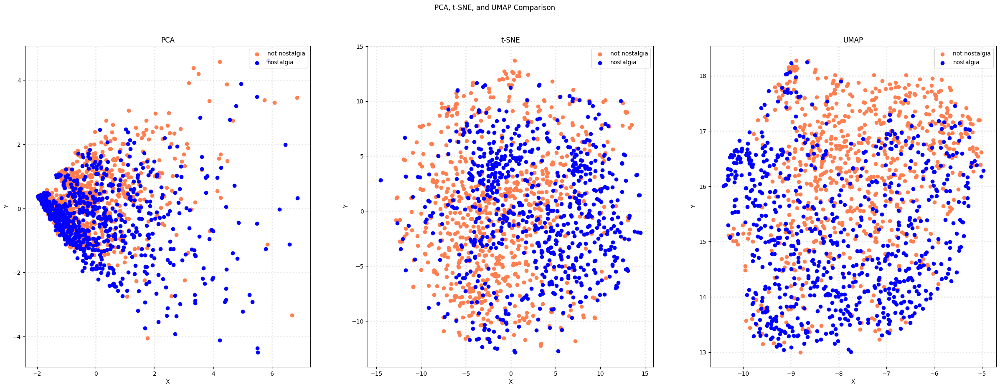

In [96]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

Now let's try in tandem with our pattern augmented data:

In [97]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

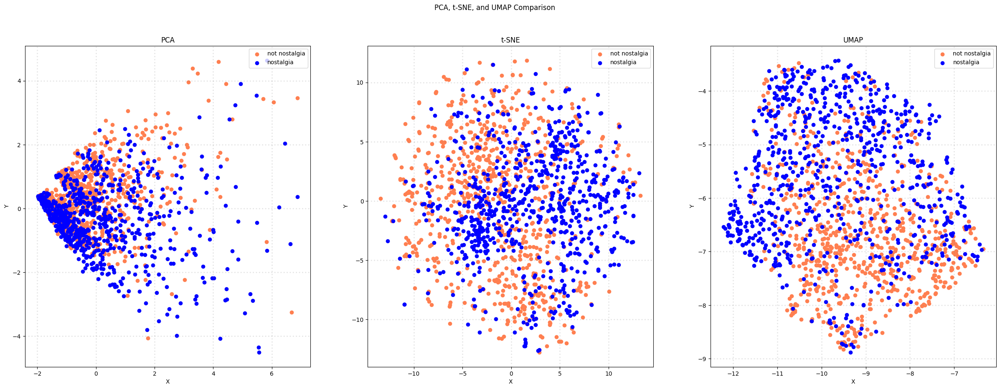

In [98]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [99]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm_ = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_ = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm_ = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

In [100]:
X_pca_tdm_.shape

(1499, 3)

In [101]:
X_tsne_tdm_.shape

(1499, 3)

In [102]:
X_umap_tdm_.shape

(1499, 3)

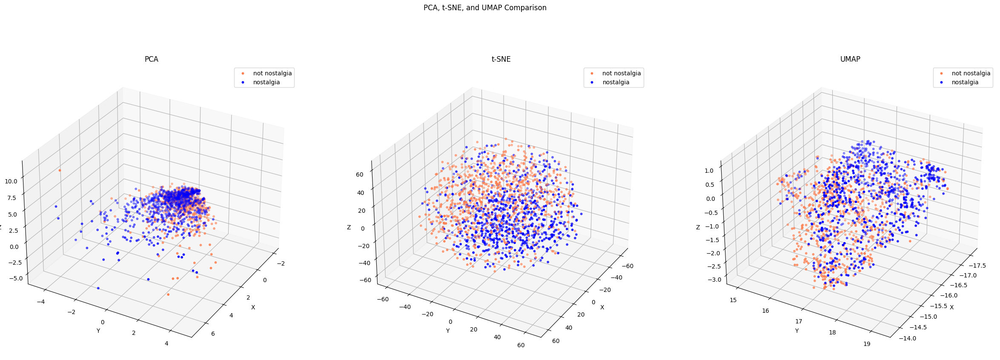

In [103]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Prepare color and category data
col = ['coral', 'blue', 'black', 'orange']
categories = X['sentiment'].unique() 

# Create 3D subplots for PCA, t-SNE, and UMAP
fig = plt.figure(figsize=(30, 10))  # Create a large figure for 3D plots
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_3d_scatter(ax, X_reduced, title, elevation=30, azimuth=30, size=10):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category][:, 0]
        ys = X_reduced[X['sentiment'] == category][:, 1]
        
        if X_reduced.shape[1] > 2:
            zs = X_reduced[X['sentiment'] == category][:, 2]
        else:
            zs = np.zeros_like(xs)  
            
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category, s=size)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    ax.view_init(elevation,azimuth)

# Create 3D axes for each method
ax1 = fig.add_subplot(131, projection='3d')  # PCA plot
ax2 = fig.add_subplot(132, projection='3d')  # t-SNE plot
ax3 = fig.add_subplot(133, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP
plot_3d_scatter(ax1, X_pca_tdm_, 'PCA')
plot_3d_scatter(ax2, X_tsne_tdm_, 't-SNE')
plot_3d_scatter(ax3, X_umap_tdm_, 'UMAP')

plt.show()

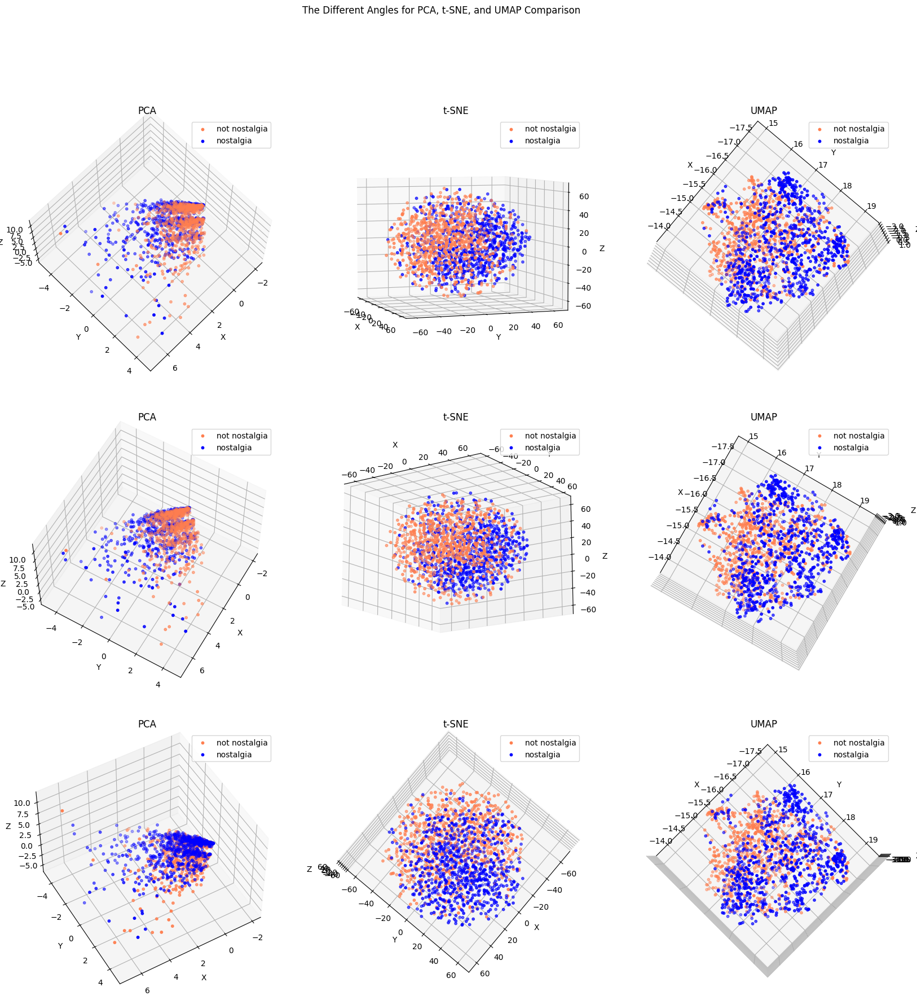

In [104]:
import matplotlib.pyplot as plt

# Create 3D subplots for PCA, t-SNE, and UMAP with different angles
fig2 = plt.figure(figsize=(20, 20)) 

# set the title
fig2.suptitle('The Different Angles for PCA, t-SNE, and UMAP Comparison')

# construct a 3*3 grid of subplots
# row 1：PCA, t-SNE, UMAP
ax4_1 = fig2.add_subplot(331, projection='3d')  # PCA plot 1
ax5_1 = fig2.add_subplot(332, projection='3d')  # t-SNE plot 1
ax6_1 = fig2.add_subplot(333, projection='3d')  # UMAP plot 1

# row2：PCA, t-SNE, UMAP
ax4_2 = fig2.add_subplot(334, projection='3d')  # PCA plot 2
ax5_2 = fig2.add_subplot(335, projection='3d')  # t-SNE plot 2
ax6_2 = fig2.add_subplot(336, projection='3d')  # UMAP plot 2

# row3：PCA, t-SNE, UMAP
ax4_3 = fig2.add_subplot(337, projection='3d')  # PCA plot 3
ax5_3 = fig2.add_subplot(338, projection='3d')  # t-SNE plot 3
ax6_3 = fig2.add_subplot(339, projection='3d')  # UMAP plot 3

# set different angles
plot_3d_scatter(ax4_1, X_pca_tdm_, 'PCA', elevation=70, azimuth=45)
plot_3d_scatter(ax5_1, X_tsne_tdm_, 't-SNE', elevation=5, azimuth=-20)
plot_3d_scatter(ax6_1, X_umap_tdm_, 'UMAP', elevation=100, azimuth=40)

plot_3d_scatter(ax4_2, X_pca_tdm_, 'PCA', elevation=60, azimuth=30)
plot_3d_scatter(ax5_2, X_tsne_tdm_, 't-SNE', elevation=-15, azimuth=-55)
plot_3d_scatter(ax6_2, X_umap_tdm_, 'UMAP', elevation=95, azimuth=30)

plot_3d_scatter(ax4_3, X_pca_tdm_, 'PCA', elevation=50, azimuth=60)
plot_3d_scatter(ax5_3, X_tsne_tdm_, 't-SNE', elevation=85, azimuth=40)
plot_3d_scatter(ax6_3, X_umap_tdm_, 'UMAP', elevation=90, azimuth=50)

plt.show()

# The clearest PCA plot can be observed at the angle settings of elevation = 60 and azimuth = 30.
# The clearest t-SNE plot can be observed at the angle settings of elevation=-15 and azimuth=-55.
# The clearest UMAP plot can be observed at the angle settings of elevation=100 and azimuth=40.

In [105]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug_ = PCA(n_components=3).fit_transform(augmented_df.values)
X_tsne_aug_ = TSNE(n_components=3).fit_transform(augmented_df.values)
X_umap_aug_ = umap.UMAP(n_components=3).fit_transform(augmented_df.values)


In [106]:
X_pca_aug_.shape

(1499, 3)

In [107]:
X_tsne_aug_.shape

(1499, 3)

In [108]:
X_umap_aug_.shape

(1499, 3)

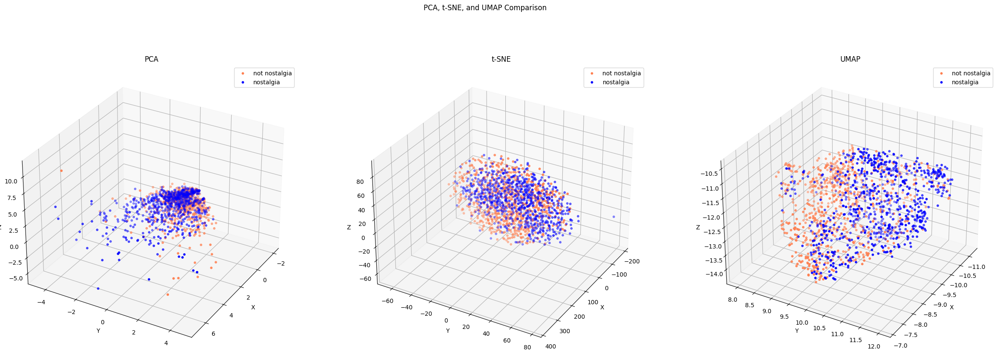

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Prepare color and category data
col = ['coral', 'blue', 'black', 'orange']
categories = X['sentiment'].unique() 

# Create 3D subplots for PCA, t-SNE, and UMAP
fig = plt.figure(figsize=(30, 10))  # Create a large figure for 3D plots
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_3d_scatter(ax, X_reduced, title, elevation=30, azimuth=30, size=10):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category][:, 0]
        ys = X_reduced[X['sentiment'] == category][:, 1]
        
        if X_reduced.shape[1] > 2:
            zs = X_reduced[X['sentiment'] == category][:, 2]
        else:
            zs = np.zeros_like(xs)  
            
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category, s=size)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
    ax.view_init(elevation,azimuth)

# Create 3D axes for each method
ax1 = fig.add_subplot(131, projection='3d')  # PCA plot
ax2 = fig.add_subplot(132, projection='3d')  # t-SNE plot
ax3 = fig.add_subplot(133, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP
plot_3d_scatter(ax1, X_pca_aug_, 'PCA')
plot_3d_scatter(ax2, X_tsne_aug_, 't-SNE')
plot_3d_scatter(ax3, X_umap_aug_, 'UMAP')

plt.show()

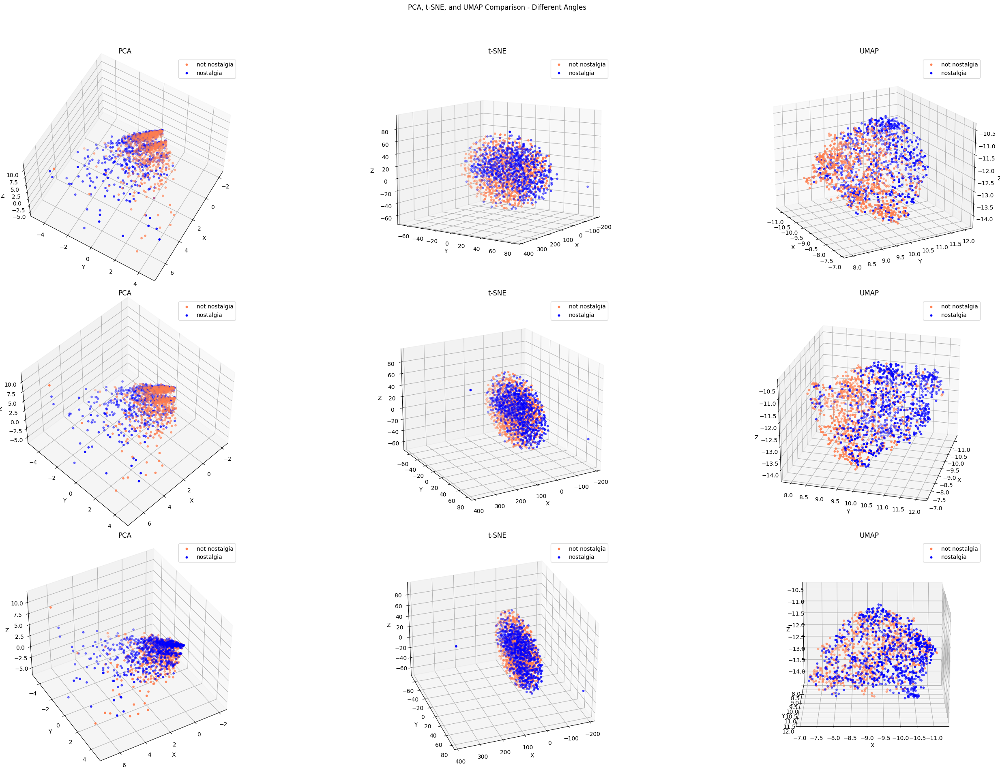

In [110]:
# Create 3D subplots for PCA, t-SNE, and UMAP in a 3x3 layout
fig2 = plt.figure(figsize=(30, 20))
fig2.suptitle('PCA, t-SNE, and UMAP Comparison - Different Angles')

# Create new 3D axes for each method in a 3x3 grid
ax4_1 = fig2.add_subplot(331, projection='3d')  # PCA plot
ax5_1 = fig2.add_subplot(332, projection='3d')  # t-SNE plot
ax6_1 = fig2.add_subplot(333, projection='3d')  # UMAP plot

ax4_2 = fig2.add_subplot(334, projection='3d')  # PCA plot
ax5_2 = fig2.add_subplot(335, projection='3d')  # t-SNE plot
ax6_2 = fig2.add_subplot(336, projection='3d')  # UMAP plot

ax4_3 = fig2.add_subplot(337, projection='3d')  # PCA plot
ax5_3 = fig2.add_subplot(338, projection='3d')  # t-SNE plot
ax6_3 = fig2.add_subplot(339, projection='3d')  # UMAP plot

# Create 3D scatter plots for PCA, t-SNE, and UMAP with different angles
plot_3d_scatter(ax4_1, X_pca_aug_, 'PCA', elevation=60, azimuth=30)  # PCA at angle 1
plot_3d_scatter(ax5_1, X_tsne_aug_, 't-SNE', elevation=10, azimuth=35)
plot_3d_scatter(ax6_1, X_umap_aug_, 'UMAP', elevation=20, azimuth=-30)

plot_3d_scatter(ax4_2, X_pca_aug_, 'PCA', elevation=50, azimuth=45)  # PCA at angle 2
plot_3d_scatter(ax5_2, X_tsne_aug_, 't-SNE', elevation=20, azimuth=60)
plot_3d_scatter(ax6_2, X_umap_aug_, 'UMAP', elevation=25, azimuth=15)

plot_3d_scatter(ax4_3, X_pca_aug_, 'PCA', elevation=40, azimuth=60)  # PCA at angle 3
plot_3d_scatter(ax5_3, X_tsne_aug_, 't-SNE', elevation=30, azimuth=70)
plot_3d_scatter(ax6_3, X_umap_aug_, 'UMAP', elevation=15, azimuth=90)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
plt.show()

# The clearest PCA plot can be observed at the angle settings of elevation = 50 and azimuth = 45.
# The clearest t-SNE plot can be observed at the angle settings of elevation=20 and azimuth=60.
# The clearest UMAP plot can be observed at the angle settings of elevation=15 and azimuth=90.

---

In [111]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [112]:
mlb = preprocessing.LabelBinarizer()

In [113]:
# calculate the total number of unique categories in the category_name column.
# There are 4 categories: 'comp.graphics', 'soc.religion.christian', 'sci.med', and 'alt.atheism'.

unique_categories = X['sentiment'].unique()
unique_categories

array(['not nostalgia', 'nostalgia'], dtype=object)

In [114]:
mlb.fit(X.sentiment)

LabelBinarizer()

In [115]:
X['bin_sentiment'] = mlb.transform(X['sentiment']).tolist()

In [116]:
X

,sentiment,comment,category,unigrams,tokenized_text,bin_sentiment
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t...","{age, now,, emotional, Jim, with, you, those, ...",[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene...","{angel, listened, forgotten, The, when, love, ...",[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{age, job, simple, were, with, early., Jesus, ...",[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{some, 2nd, ""marry, pray, convince, you, my, g...",[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,1,"[listening, to, his, songs, reminds, me, of, m...","{songs, played, his, listening, him, mum, ever...",[0]
...,...,...,...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0,"[i, do, n't, know, !, .., but, the, opening, o...","{i, video,..seeing, that, on, thing, know!..bu...",[1]
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0,"[it, 's, sad, this, is, such, a, beautiful, so...","{you, when, love, to, beautiful, song, tell, h...",[1]
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0,"[Dear, Friend, ,, I, think, age, and, time, is...","{age, you, when, important, to, think, Dear, F...",[1]
1498,nostalgia,I was born in 1954 and started to be aware of ...,1,"[I, was, born, in, 1954, and, started, to, be,...","{age, presentation,, and,, 5, been, my, 4, lov...",[0]


## Data Exploration

Sometimes you need to take a peek at your data to understand the relationships in your dataset. Here, we will focus in a similarity example. Let's take 3 documents and compare them.

In [117]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = X.iloc[50] # the index 50
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = X.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = X.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

Let's look at our emails.

In [118]:
print(document_to_transform_1) # check the text
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [119]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [120]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\ChienYu\AppData\Local\Temp\ipykernel_3884\452772485.py:17: DeprecationWarning:

Conversion of an array with ndim > 0 t

### Data Classification

In [121]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(X[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, X['category'], test_size=0.3, random_state=42)

In [122]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9389    0.7788    0.8514       217
    nostalgia     0.8222    0.9528    0.8827       233

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



In [123]:
#Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(X[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, X['category'], test_size=0.3, random_state=42)

In [124]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8533333333333334

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9632    0.7235    0.8263       217
    nostalgia     0.7909    0.9742    0.8731       233

     accuracy                         0.8533       450
    macro avg     0.8771    0.8489    0.8497       450
 weighted avg     0.8740    0.8533    0.8505       450



# TF-IDF

In [125]:
X

,sentiment,comment,category,unigrams,tokenized_text,bin_sentiment
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t...","{age, now,, emotional, Jim, with, you, those, ...",[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene...","{angel, listened, forgotten, The, when, love, ...",[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{age, job, simple, were, with, early., Jesus, ...",[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{some, 2nd, ""marry, pray, convince, you, my, g...",[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,1,"[listening, to, his, songs, reminds, me, of, m...","{songs, played, his, listening, him, mum, ever...",[0]
...,...,...,...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0,"[i, do, n't, know, !, .., but, the, opening, o...","{i, video,..seeing, that, on, thing, know!..bu...",[1]
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0,"[it, 's, sad, this, is, such, a, beautiful, so...","{you, when, love, to, beautiful, song, tell, h...",[1]
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0,"[Dear, Friend, ,, I, think, age, and, time, is...","{age, you, when, important, to, think, Dear, F...",[1]
1498,nostalgia,I was born in 1954 and started to be aware of ...,1,"[I, was, born, in, 1954, and, started, to, be,...","{age, presentation,, and,, 5, been, my, 4, lov...",[0]


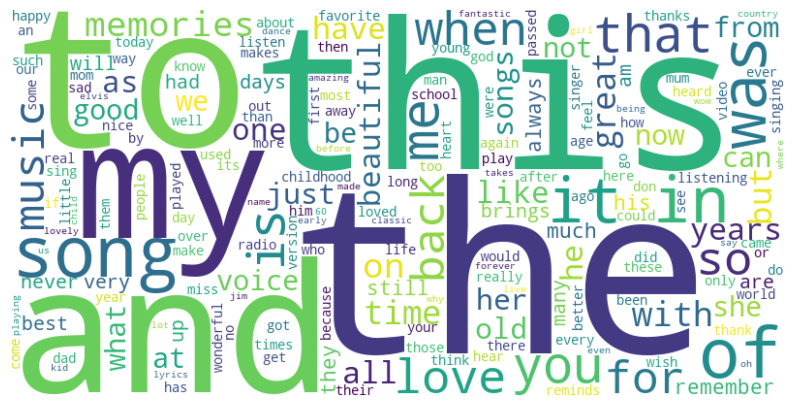

In [126]:
# Plot the word cloud of the comments from original dataset.

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Count the number of times each term appears in each document.
# Calculate the term frequency by summing the number of times each term appears in each document.
term_frequencies = X_counts.sum(axis=0)  # count
term_frequencies = np.array(term_frequencies)[0]  # transform to array
terms = count_vect.get_feature_names_out() 

# Construct the word frequency dictionary
word_freq = {terms[i]: term_frequencies[i] for i in range(len(terms))}

# Construct the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()

# It shows the word cloud of the comments.

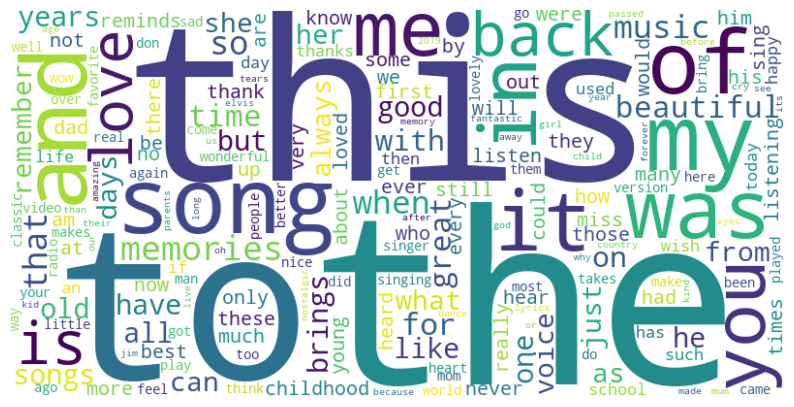

In [127]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Use TfidfVectorizer to calculate TF-IDF features
tfidf_vect = TfidfVectorizer()

# Fit and transform the original text data to generate the TF-IDF feature matrix
X_tfidf = tfidf_vect.fit_transform(X['comment']) 

# Get the list of terms (feature names)
terms = tfidf_vect.get_feature_names_out()

# Transform the TF-IDF feature matrix to an array
tfidf_array = X_tfidf.toarray()

# Calculate the total TF-IDF value for each term
term_tfidf_totals = tfidf_array.sum(axis=0)

# Create a dictionary mapping each term to its total TF-IDF value
word_tfidf = {terms[i]: term_tfidf_totals[i] for i in range(len(terms))}

# WordCloud
wordcloud_tfidf = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_tfidf)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_tfidf, interpolation='bilinear')
plt.axis('off') 
plt.show()

# There are some differences between the word cloud of the original dataset and the word cloud of the TF-IDF features.
# The TF-IDF features are more informative than the original dataset, it represent the importance of each term.

In [131]:
import pandas as pd
from sklearn.naive_bayes import BernoulliNB
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.metrics import classification_report, accuracy_score

# Build word frequency-based classifier (MultinomialNB)
count_vect = CountVectorizer()
X_count = count_vect.fit_transform(X['comment'])

# Split the dataset into training and testing sets (70% train, 30% test)
X_train_count, X_test_count, y_train, y_test = train_test_split(X_count, X['sentiment'], test_size=0.3, random_state=42)

# Train the Multinomial Naive Bayes model
nb_count = MultinomialNB()
nb_count.fit(X_train_count, y_train)

# Predict on the test set
y_pred_count = nb_count.predict(X_test_count)

print("Accuracy (Word Frequency):", accuracy_score(y_test, y_pred_count))
print("\nClassification Report (Word Frequency):\n", classification_report(y_test, y_pred_count))

# Precision: Proportion of correctly predicted positive instances out of all predicted positives.
# Recall: Proportion of correctly predicted positive instances out of all actual positives.
# F1-Score: Harmonic mean of precision and recall, balancing the two metrics.
# Support: Number of actual occurrences of each class in the test set.

# Build TF-IDF-based classifier (GaussianNB)
tfidf_vect = TfidfVectorizer()
X_tfidf = tfidf_vect.fit_transform(X['comment']).toarray()  # GaussianNB requires an array as input

# Split the dataset
X_train_tfidf, X_test_tfidf, y_train, y_test = train_test_split(X_tfidf, X['sentiment'], test_size=0.3, random_state=42)

# Train the Gaussian Naive Bayes model
nb_tfidf = BernoulliNB()
nb_tfidf.fit(X_train_tfidf, y_train)

# Predict on the test set
y_pred_tfidf = nb_tfidf.predict(X_test_tfidf)

print("Accuracy (TF-IDF):", accuracy_score(y_test, y_pred_tfidf))
print("\nClassification Report (TF-IDF):\n", classification_report(y_test, y_pred_tfidf))

# The accuracy of the word frequency-based classifier is 0.8689.
# The accuracy of the TF-IDF-based classifier is 0.8844.
# The accuracy of the TF-IDF-based classifier is higher than the accuracy of the word frequency-based classifier.
# TF-IDF emphasizes the relative importance of key terms, which may reduce the model's accuracy on sparse features.
# The difference of the model: 
# MultinomialNB is suitable for count data and BernoulliNB is suitable for binary data.

Accuracy (Word Frequency): 0.8688888888888889

Classification Report (Word Frequency):
                precision    recall  f1-score   support

    nostalgia       0.82      0.95      0.88       233
not nostalgia       0.94      0.78      0.85       217

     accuracy                           0.87       450
    macro avg       0.88      0.87      0.87       450
 weighted avg       0.88      0.87      0.87       450

Accuracy (TF-IDF): 0.8844444444444445

Classification Report (TF-IDF):
                precision    recall  f1-score   support

    nostalgia       0.85      0.94      0.89       233
not nostalgia       0.93      0.82      0.87       217

     accuracy                           0.88       450
    macro avg       0.89      0.88      0.88       450
 weighted avg       0.89      0.88      0.88       450



---

# The Data preprocessing

 - When removing duplicate rows, it's actually sufficient to use `X.drop_duplicates(keep='first', inplace=True)` directly without first identifying all the duplicate rows. 

 - Similarly, when handling missing values, it's enough to use `df.dropna(axis=0, inplace=True)`.
 
 - When I was generating the heatmap, I initially selected the top 20 words from the top 20 texts. However, this resulted in a very sparse dataset. So, I first ranked the words by their frequency and then selected the top 20. This method effectively helped in finding the focal points.

 - When I was creating 3D plots, I arranged them in a 3x3 grid of subplots. This made it easier to compare which one was clearer, eliminating the need for constant adjustments and comparisons.

---